Connected to Python 3.11.5

Connected to mne (Python 3.12.8)

In [ ]:
import matplotlib

In [ ]:
pilot_dir = '/Users/denizyilmaz/Desktop/eeg_test_data/RNet and Slim Test/test_r_net_ec.vhdr'

In [ ]:
pilot_dir = '/Users/denizyilmaz/Desktop/eeg_test_data/RNet and Slim Test'

#pilot_dir = "/Users/denizyilmaz/Desktop/BrainTrain/pilot_analysis/BrainTrain_pilot_data_Michelle"
os.chdir(pilot_dir)

In [ ]:
os.listdir()

['test_r_net_ec.eeg',
 'test_slim_32_ec.eeg',
 'test_slim_32_ec.vmrk',
 'test_slim_32_ec.vhdr',
 'test_slim_32_eo.vmrk',
 'test_slim_32_eo.vhdr',
 'test_r_net_eo.vhdr',
 'test_r_net_eo.vmrk',
 'test_r_net_ec.vhdr',
 'test_r_net_ec.vmrk',
 'test_slim_32_eo.eeg',
 'test_r_net_eo.eeg']

In [ ]:
raw = mne.io.read_raw("test_r_net_ec.vhdr", preload=True)

Extracting parameters from test_r_net_ec.vhdr...
Setting channel info structure...


<ipython-input-10-7f7c2c8666d1>:1: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = mne.io.read_raw("test_r_net_ec.vhdr", preload=True)


Reading 0 ... 180139  =      0.000 ...   360.278 secs...


In [ ]:
raw.plot()

2026-04-28 18:31:32,812 - OpenGL.acceleratesupport - INFO - No OpenGL_accelerate module loaded: No module named 'OpenGL_accelerate'


Using qt as 2D backend.
Using pyopengl with version 3.1.6


Channels marked as bad:
none


In [ ]:
print(raw.info)

<Info | 7 non-empty values
 bads: []
 ch_names: Fp1, Fz, F3, F7, F9, FC5, FC1, C3, T7, CP5, CP1, Pz, P3, P7, P9, ...
 chs: 64 EEG
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 100.0 Hz
 meas_date: 2026-04-28 12:16:52 UTC
 nchan: 64
 projs: []
 sfreq: 500.0 Hz
>


NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 4.096 (s)
Plotting power spectral density (dB=True).


<ipython-input-13-a5fcf744740b>:1: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  raw.plot_psd()
/Users/denizyilmaz/miniconda3/envs/mne/lib/python3.12/site-packages/mne/viz/utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


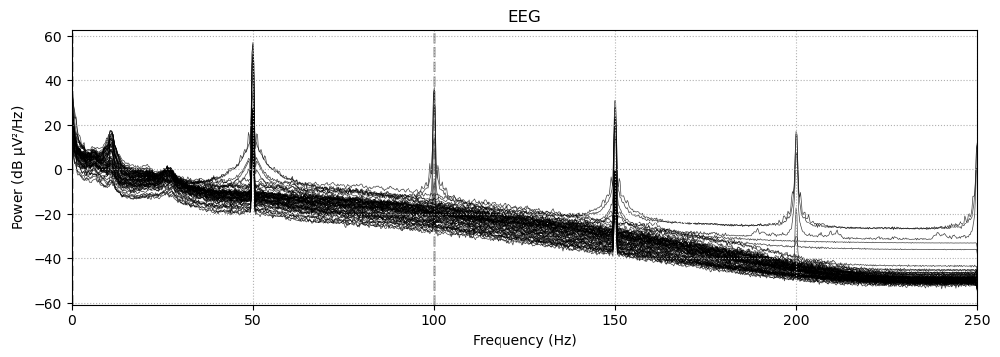

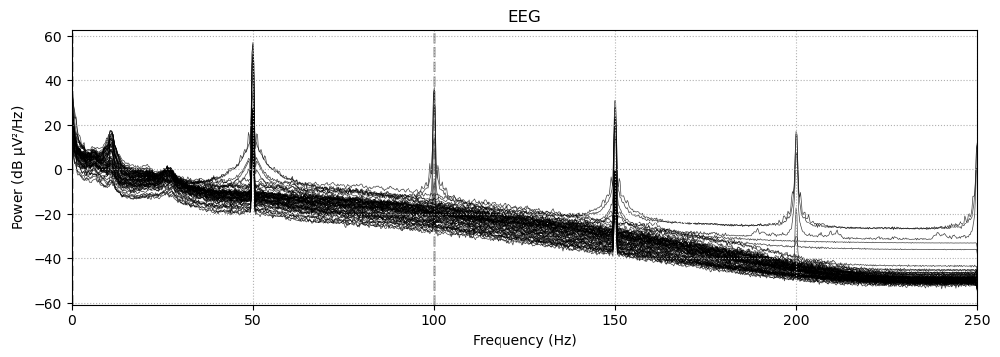

In [ ]:
raw.plot_psd()

In [ ]:
raw.describe()

<RawBrainVision | test_r_net_ec.eeg, 64 x 180140 (360.3 s), ~88.0 MiB, data loaded>
ch  name  type  unit        min         Q1     median         Q3        max
 0  Fp1   EEG   µV     -2117.10   -1362.40    -453.70     511.00    1270.30
 1  Fz    EEG   µV      -853.50    -686.40    -535.60    -416.60     -75.80
 2  F3    EEG   µV      -366.90    -244.80    -150.70      15.90     362.40
 3  F7    EEG   µV     -2481.90   -2284.50   -2075.70   -1695.60    -769.00
 4  F9    EEG   µV     -1333.50   -1243.70   -1140.10    -906.57    -474.90
 5  FC5   EEG   µV      -256.00     -10.10      16.10      79.90     577.20
 6  FC1   EEG   µV     -1670.10   -1512.50   -1240.30    -664.00    -208.20
 7  C3    EEG   µV     -2904.40   -2754.10   -2435.70   -1903.20   -1105.80
 8  T7    EEG   µV     -2741.20   -2496.00   -2008.00   -1264.20    -407.90
 9  CP5   EEG   µV     -1298.40   -1047.10    -810.00    -410.30      66.50
10  CP1   EEG   µV       698.90    2556.68    3276.70    3276.70    3276.70
11  

In [ ]:
print(type(raw._data))

<class 'numpy.ndarray'>


In [ ]:
print(raw._data.shape)

(64, 180140)


In [ ]:
print(raw.ch_names)

['Fp1', 'Fz', 'F3', 'F7', 'F9', 'FC5', 'FC1', 'C3', 'T7', 'CP5', 'CP1', 'Pz', 'P3', 'P7', 'P9', 'O1', 'Oz', 'O2', 'P10', 'P8', 'P4', 'CP2', 'CP6', 'T8', 'C4', 'Cz', 'FC2', 'FC6', 'F10', 'F8', 'F4', 'Fp2', 'AF7', 'AF3', 'AFz', 'F1', 'F5', 'FT7', 'FC3', 'C1', 'C5', 'TP7', 'CP3', 'P1', 'P5', 'PO7', 'PO3', 'Iz', 'POz', 'PO4', 'PO8', 'P6', 'P2', 'CPz', 'CP4', 'TP8', 'C6', 'C2', 'FC4', 'FT8', 'F6', 'F2', 'AF4', 'AF8']


In [ ]:
mne.channels.make_standard_montage?


Signature: mne.channels.make_standard_montage(kind, head_size='auto')
Docstring:
Read a generic (built-in) standard montage that ships with MNE-Python.

Parameters
----------
kind : str
    The name of the montage to use.

    .. note::
        You can retrieve the names of all
        built-in montages via :func:`mne.channels.get_builtin_montages`.
head_size : float | None | str
    The head size (radius, in meters) to use for spherical montages.
    Can be None to not scale the read sizes. ``'auto'`` (default) will
    use 95mm for all montages except the ``'standard*'``, ``'mgh*'``, and
    ``'artinis*'``, which are already in fsaverage's MRI coordinates
    (same as MNI).

Returns
-------
montage : instance of DigMontage
    The montage.

See Also
--------
get_builtin_montages
make_dig_montage
read_custom_montage

Notes
-----
Individualized (digitized) electrode positions should be read in using
:func:`read_dig_captrak`, :func:`read_dig_dat`, :func:`read_dig_egi`,
:func:`read_dig_f

In [ ]:
mne.channels.get_builtin_montages

<function mne.channels.montage.get_builtin_montages(*, descriptions=False)>

In [ ]:
mne.channels.get_builtin_montages()

['standard_1005',
 'standard_1020',
 'standard_alphabetic',
 'standard_postfixed',
 'standard_prefixed',
 'standard_primed',
 'biosemi16',
 'biosemi32',
 'biosemi64',
 'biosemi128',
 'biosemi160',
 'biosemi256',
 'easycap-M1',
 'easycap-M10',
 'easycap-M43',
 'EGI_256',
 'GSN-HydroCel-32',
 'GSN-HydroCel-64_1.0',
 'GSN-HydroCel-65_1.0',
 'GSN-HydroCel-128',
 'GSN-HydroCel-129',
 'GSN-HydroCel-256',
 'GSN-HydroCel-257',
 'mgh60',
 'mgh70',
 'artinis-octamon',
 'artinis-brite23',
 'brainproducts-RNP-BA-128']

In [ ]:
new_sampling_rate = 250

In [ ]:
# Resample the EEG data to the new sampling rate
raw_resampled = raw.copy()
raw_resampled.resample(sfreq=new_sampling_rate)

print(raw_resampled.info["sfreq"])

250.0


Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 49 - 51 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 49.38
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 49.12 Hz)
- Upper passband edge: 50.62 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 50.88 Hz)
- Filter length: 1651 samples (6.604 s)

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 8.192 (s)
Plotting power spectral density (dB=True).


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
<ipython-input-26-dd8de8277300>:7: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  raw_resampled_line.plot_psd()
/Users/denizyilmaz/miniconda3/envs/mne/lib/python3.12/site-packages/mne/viz/utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


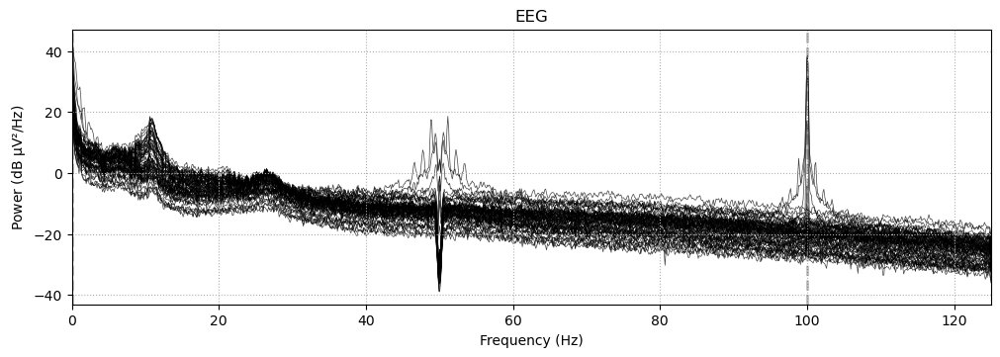

In [ ]:
# A. Remove line noise
# Apply notch filter to remove line noise (e.g., 50 Hz from Antonin's manuscript)
line_freq = 50  # Set the line frequency to 50, as Antonin did: 
raw_resampled_line= raw_resampled.copy()
raw_resampled_line.notch_filter(freqs=line_freq)  # Apply notch filter to EEG channels only ?? OR: 49.5 to 50.5 in a method ??
# Plot the data to visualize the effect of the notch filter
raw_resampled_line.plot_psd()

In [ ]:
raw.plot(color=None)  # ← this usually gives you multicolor lines

Using pyopengl with version 3.1.6


Channels marked as bad:
none


Effective window size : 8.192 (s)
Plotting power spectral density (dB=True).


<ipython-input-29-865124efb01b>:1: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  raw_resampled_line.compute_psd().plot(picks='eeg')
/Users/denizyilmaz/miniconda3/envs/mne/lib/python3.12/site-packages/mne/viz/utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


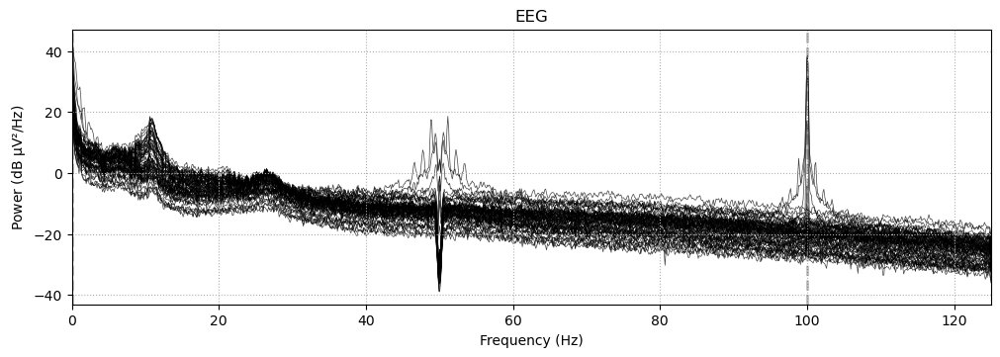

In [ ]:
raw_resampled_line.compute_psd().plot(picks='eeg')

In [ ]:
# B.Robust average rereferencing
raw_resampled_line_reref = raw_resampled_line.copy()
raw_resampled_line_reref.set_eeg_reference(ref_channels='average')
raw_resampled_line_reref.plot()

EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
Using pyopengl with version 3.1.6


Channels marked as bad:
none


NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 8.192 (s)
Plotting power spectral density (dB=True).


<ipython-input-31-a70e86eb3e96>:1: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  raw_resampled_line_reref.plot_psd()
/Users/denizyilmaz/miniconda3/envs/mne/lib/python3.12/site-packages/mne/viz/utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


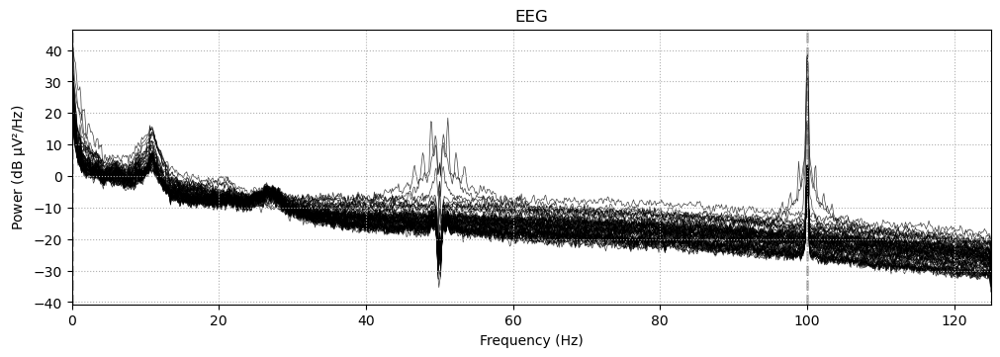

In [ ]:
raw_resampled_line_reref.plot_psd()

In [ ]:
raw_resampled_line_reref.plot()

Using pyopengl with version 3.1.6


In [ ]:
raw_resampled_line_reref_interp = raw_resampled_line_reref.copy()
# Assign the mne object to the NoisyChannels class. The resulting object will be the place where all following methods are performed.
noisy_data = NoisyChannels(raw_resampled_line_reref, random_state=1337)

NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 825 samples (3.300 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


In [ ]:
# find bad by corr
noisy_data.find_bad_by_correlation()
print("Bad channels by correlation:", noisy_data.bad_by_correlation)
# find bad by deviation
noisy_data.find_bad_by_deviation()
print("Bad channels by deviation:", noisy_data.bad_by_deviation)

Bad channels by correlation: ['P3', 'F2']
Bad channels by deviation: ['Fp2', 'F2']


In [ ]:
raw_resampled_line_reref_interp.info["bads"] = noisy_data.get_bads()
bads = noisy_data.get_bads()

In [ ]:
bads

['P3', 'Fp2', 'F2']

In [ ]:
# Load the easycap-M1 montage (check if its truw by checking the cap)
montage = mne.channels.make_standard_montage('standard_1020')

# Apply the montage to your raw data
raw.set_montage(montage)

<RawBrainVision | test_r_net_ec.eeg, 64 x 180140 (360.3 s), ~88.0 MiB, data loaded>

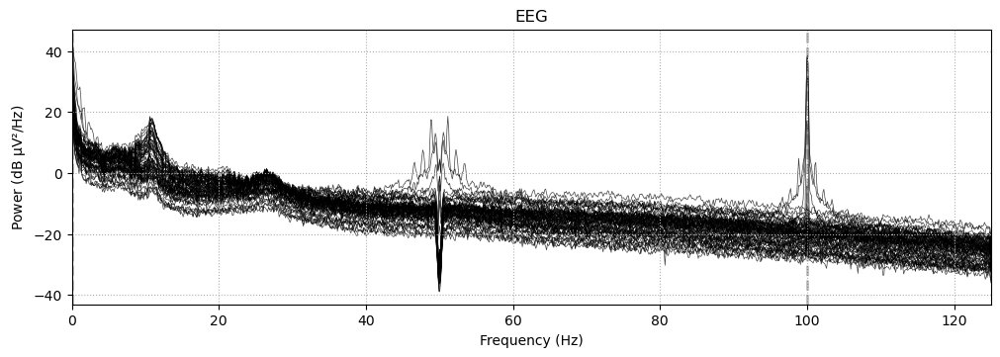

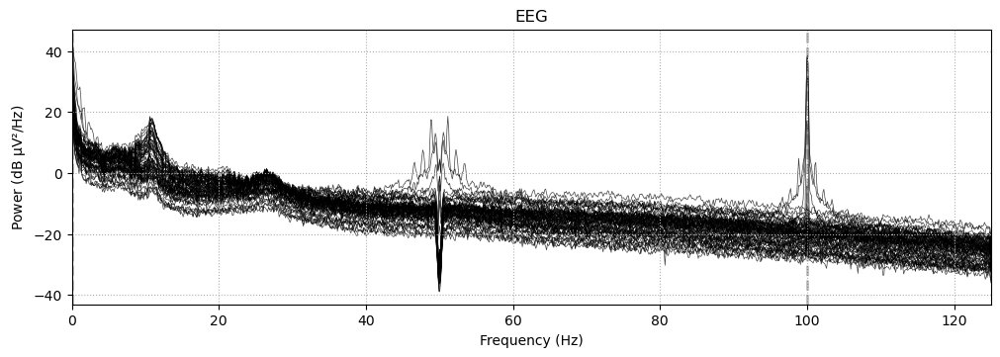

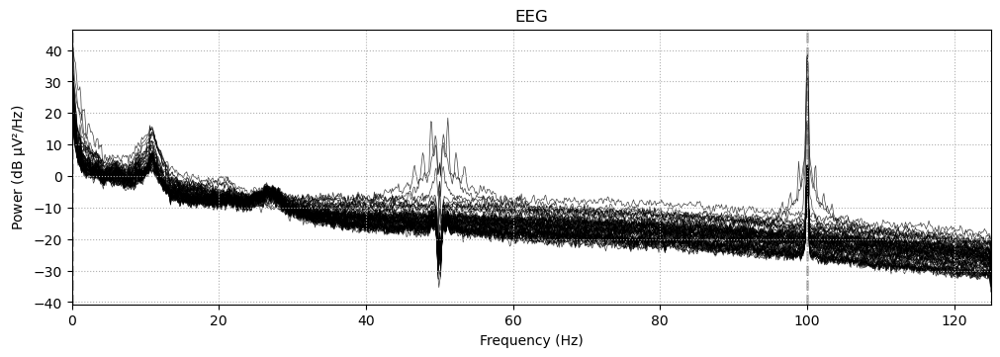

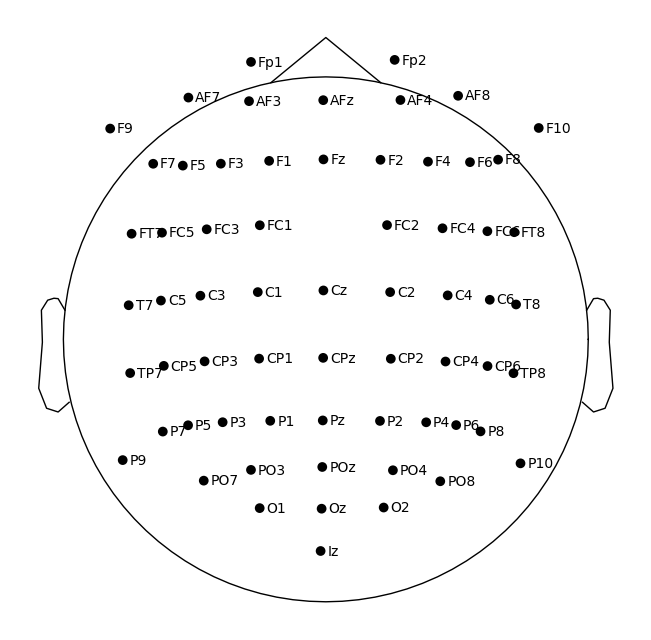

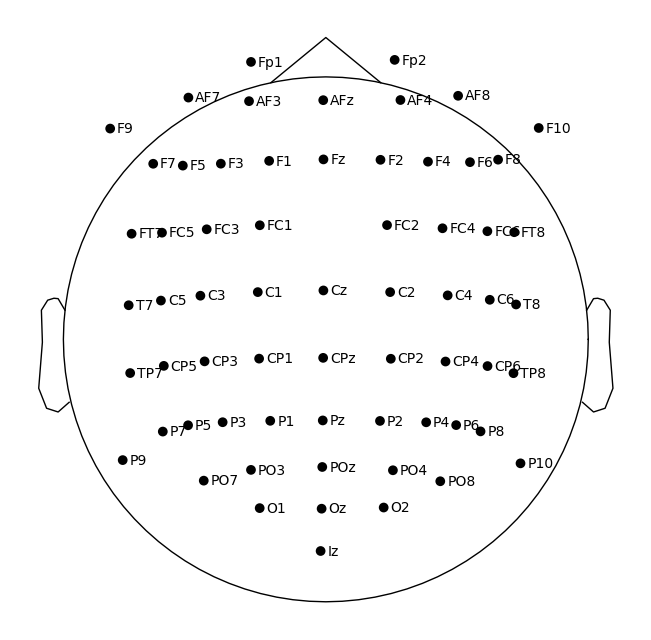

In [ ]:
raw.plot_sensors(show_names=True)

In [ ]:
new_sampling_rate = 250 

# Resample the EEG data to the new sampling rate
raw_resampled = raw.copy()
raw_resampled.resample(sfreq=new_sampling_rate)

print(raw_resampled.info["sfreq"])

250.0


In [ ]:
raw.plot(n_channels=20, scalings='auto')

Using pyopengl with version 3.1.6


Channels marked as bad:
none
Channels marked as bad:
none


Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 49 - 51 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 49.38
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 49.12 Hz)
- Upper passband edge: 50.62 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 50.88 Hz)
- Filter length: 1651 samples (6.604 s)

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 8.192 (s)
Plotting power spectral density (dB=True).


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
/Users/denizyilmaz/miniconda3/envs/mne/lib/python3.12/site-packages/mne/viz/utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


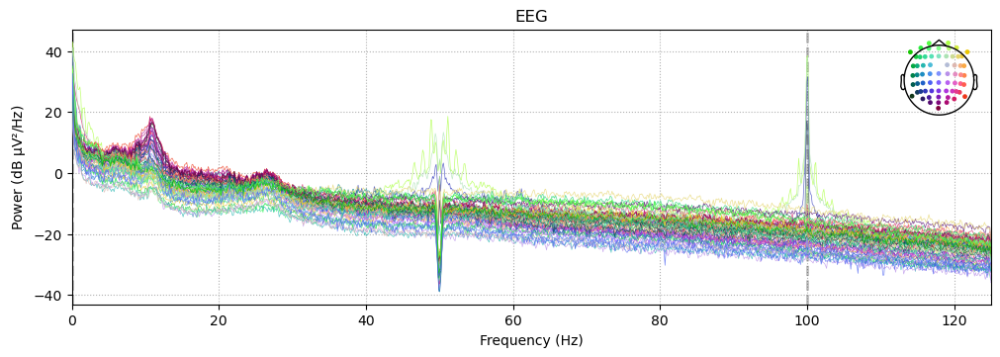

In [ ]:
# Apply notch filter to remove line noise (e.g., 50 Hz from Antonin's manuscript)
line_freq = 50  # Set the line frequency to 50, as Antonin did: 
raw_resampled_line= raw_resampled.copy()
raw_resampled_line.notch_filter(freqs=line_freq)  # Apply notch filter to EEG channels only ?? OR: 49.5 to 50.5 in a method ??
# Plot the data to visualize the effect of the notch filter
raw_resampled_line.plot_psd()

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 8.192 (s)
Plotting power spectral density (dB=True).


/Users/denizyilmaz/miniconda3/envs/mne/lib/python3.12/site-packages/mne/viz/utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


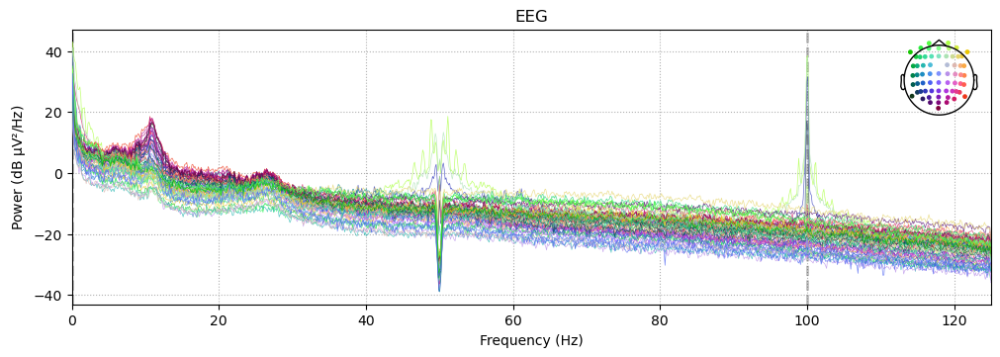

In [ ]:
raw_resampled_line.plot_psd()


EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
Using pyopengl with version 3.1.6
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 8.192 (s)
Plotting power spectral density (dB=True).


/Users/denizyilmaz/miniconda3/envs/mne/lib/python3.12/site-packages/mne/viz/utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


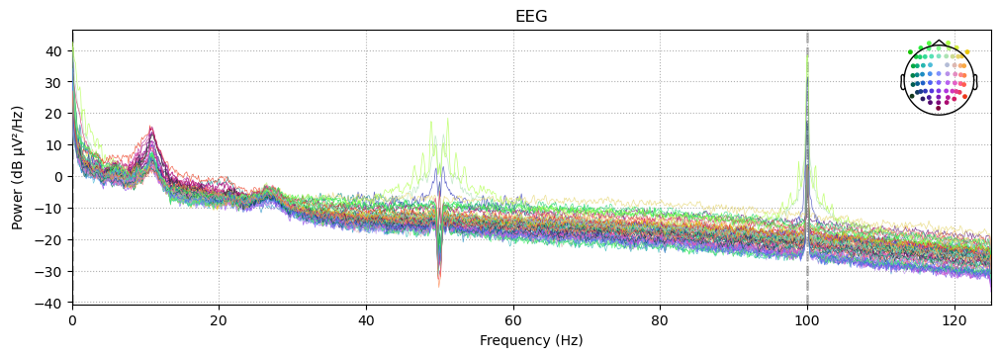

Channels marked as bad:
none


In [ ]:
raw_resampled_line_reref = raw_resampled_line.copy()
raw_resampled_line_reref.set_eeg_reference(ref_channels='average')
raw_resampled_line_reref.plot()
raw_resampled_line_reref.plot_psd()

In [ ]:
raw_resampled_line_reref_interp = raw_resampled_line_reref.copy()
# Assign the mne object to the NoisyChannels class. The resulting object will be the place where all following methods are performed.
noisy_data = NoisyChannels(raw_resampled_line_reref, random_state=1337)
# find bad by corr
noisy_data.find_bad_by_correlation()
print("Bad channels by correlation:", noisy_data.bad_by_correlation)
# find bad by deviation
noisy_data.find_bad_by_deviation()
print("Bad channels by deviation:", noisy_data.bad_by_deviation)

NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 825 samples (3.300 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Bad channels by correlation: ['P3', 'F2']
Bad channels by deviation: ['Fp2', 'F2']


In [ ]:
noisy_data.find_bad_by_ransac(channel_wise=True, max_chunk_size=1) 
print("Bad channels by RANSAC:", noisy_data.bad_by_ransac)

Executing RANSAC
This may take a while, so be patient...
Finding optimal chunk size : 1
Total # of chunks: 61
Current chunk:
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61

RANSAC done!
Bad channels by RANSAC: [np.str_('CP1'), np.str_('F1'), np.str_('F5'), np.str_('PO3'), np.str_('PO8'), np.str_('TP8'), np.str_('F6'), np.str_('AF8')]


In [ ]:
raw_resampled_line_reref_interp.info["bads"] = noisy_data.get_bads()
bads = noisy_data.get_bads()

In [ ]:
bads

[np.str_('PO8'),
 'F2',
 np.str_('F5'),
 'P3',
 np.str_('F6'),
 np.str_('F1'),
 np.str_('TP8'),
 np.str_('PO3'),
 np.str_('AF8'),
 'Fp2',
 np.str_('CP1')]

In [ ]:
raw_resampled_line_reref_interp.interpolate_bads()

Setting channel interpolation method to {'eeg': 'spline'}.
Interpolating bad channels.
    Automatic origin fit: head of radius 95.9 mm
Computing interpolation matrix from 53 sensor positions
Interpolating 11 sensors


<RawBrainVision | test_r_net_ec.eeg, 64 x 90070 (360.3 s), ~44.1 MiB, data loaded>

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 8.192 (s)
Plotting power spectral density (dB=True).


/Users/denizyilmaz/miniconda3/envs/mne/lib/python3.12/site-packages/mne/viz/utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


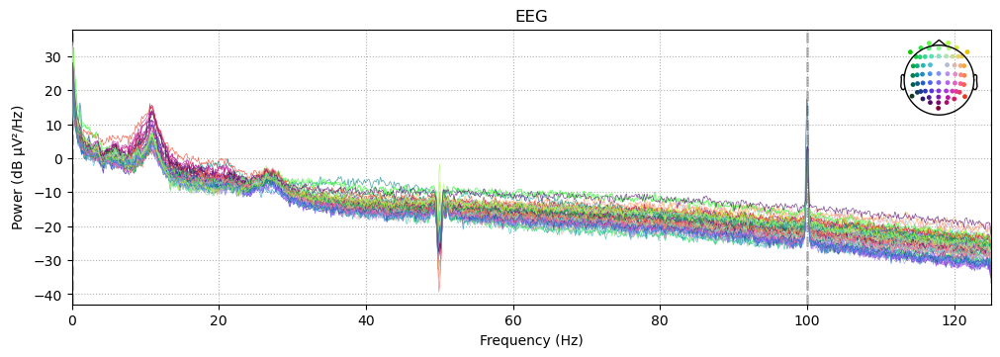

In [ ]:
raw_resampled_line_reref_interp.plot_psd()

In [ ]:
raw_resampled_line_reref_interp_filt = raw_resampled_line_reref_interp.copy()
# Define the bandpass filter frequency range
low_freq = 0.3  # Lower cutoff frequency (in Hz)
#low_freq = 1
high_freq = 45.0  # Upper cutoff frequency (in Hz)

In [ ]:
raw_resampled_line_reref_interp_filt.filter(l_freq=low_freq, h_freq=high_freq, method='fir', phase='zero') # check method and phase

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.3 - 45 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.30
- Lower transition bandwidth: 0.30 Hz (-6 dB cutoff frequency: 0.15 Hz)
- Upper passband edge: 45.00 Hz
- Upper transition bandwidth: 11.25 Hz (-6 dB cutoff frequency: 50.62 Hz)
- Filter length: 2751 samples (11.004 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


<RawBrainVision | test_r_net_ec.eeg, 64 x 90070 (360.3 s), ~44.1 MiB, data loaded>

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 8.192 (s)
Plotting power spectral density (dB=True).


/Users/denizyilmaz/miniconda3/envs/mne/lib/python3.12/site-packages/mne/viz/utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


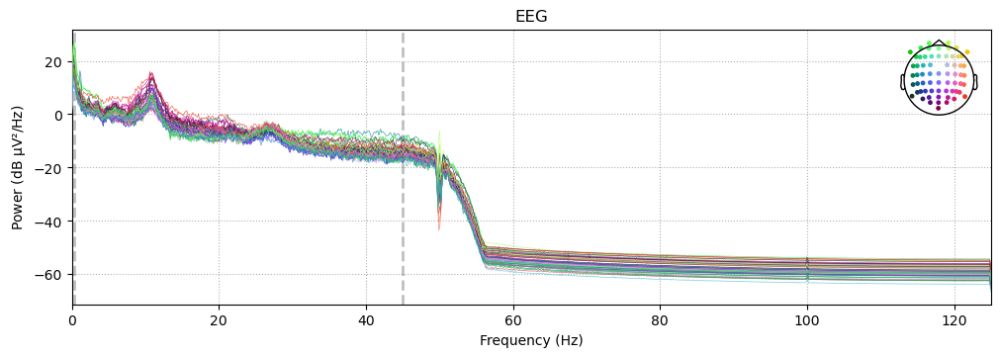

In [ ]:
raw_resampled_line_reref_interp_filt.plot_psd()

In [ ]:
raw_ica = raw_resampled_line_reref_interp_filt.copy().filter(l_freq=1.0, h_freq=None)
# you can try and see lower for heart artifacts but other components may get worse
#raw_ica = raw_resampled_line_reref_interp_filt.copy().filter(l_freq=0.1, h_freq=None)


# set up and fit the ICA
ica = ICA(n_components=27, max_iter="auto", random_state=97) # initially 30
ica.fit(raw_ica)
ica

Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 825 samples (3.300 s)

Fitting ICA to data using 64 channels (please be patient, this may take a while)
Selecting by number: 27 components


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Fitting ICA took 2.9s.


Method,fastica
Fit parameters,algorithm=parallelfun=logcoshfun_args=Nonemax_iter=1000
Fit,44 iterations on raw data (90070 samples)
ICA components,27
Available PCA components,64
Channel types,eeg
ICA components marked for exclusion,—


Fraction of eeg variance explained by all components: 0.9855058011250731
Creating RawArray with float64 data, n_channels=27, n_times=90070
    Range : 0 ... 90069 =      0.000 ...   360.276 secs
Ready.
Using pyopengl with version 3.1.6


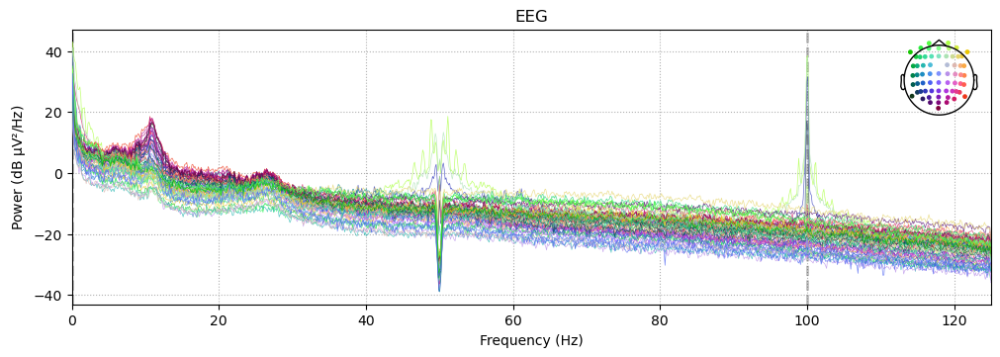

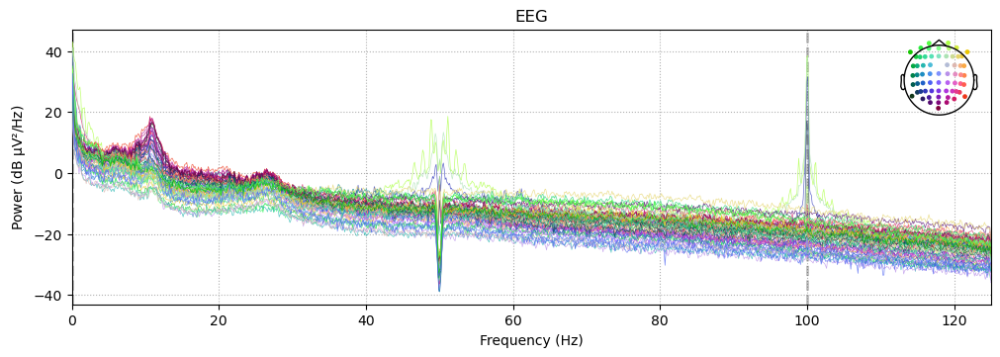

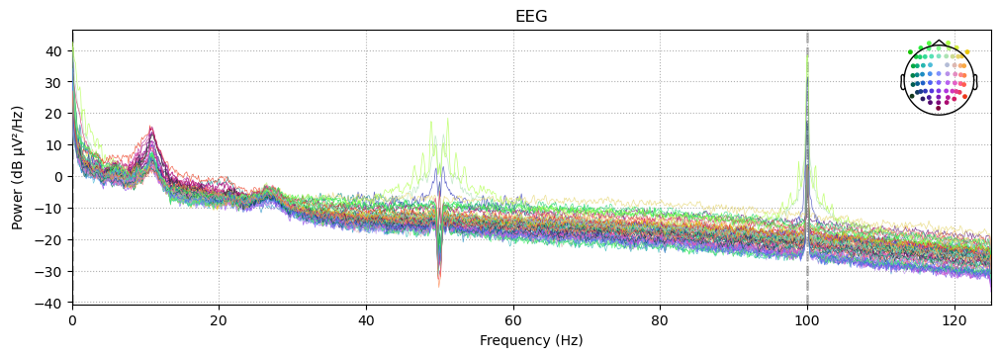

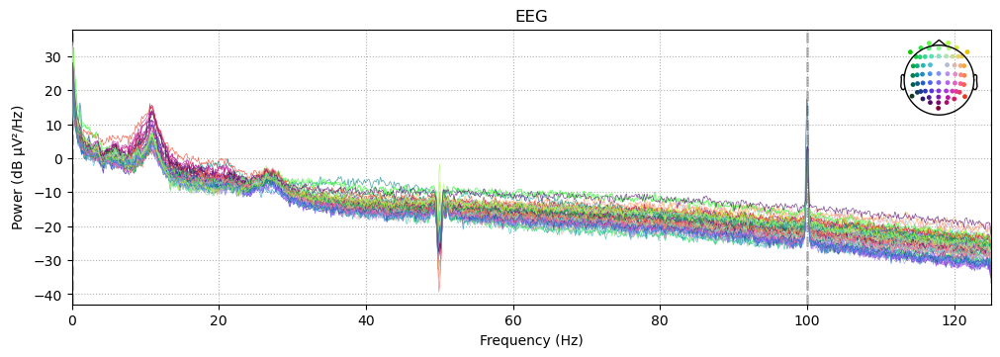

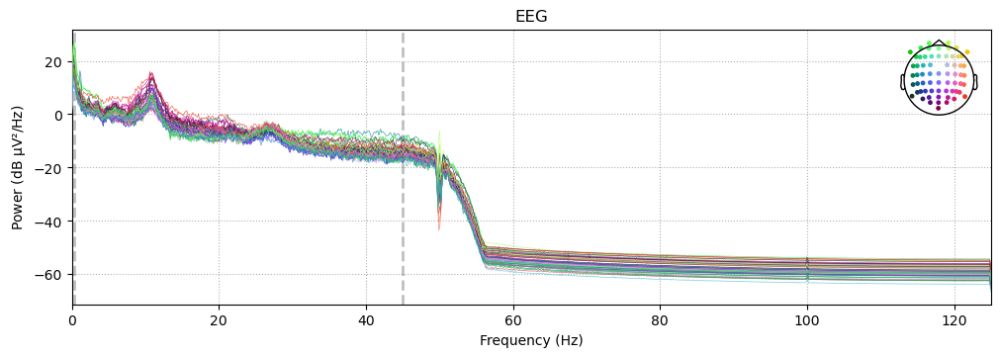

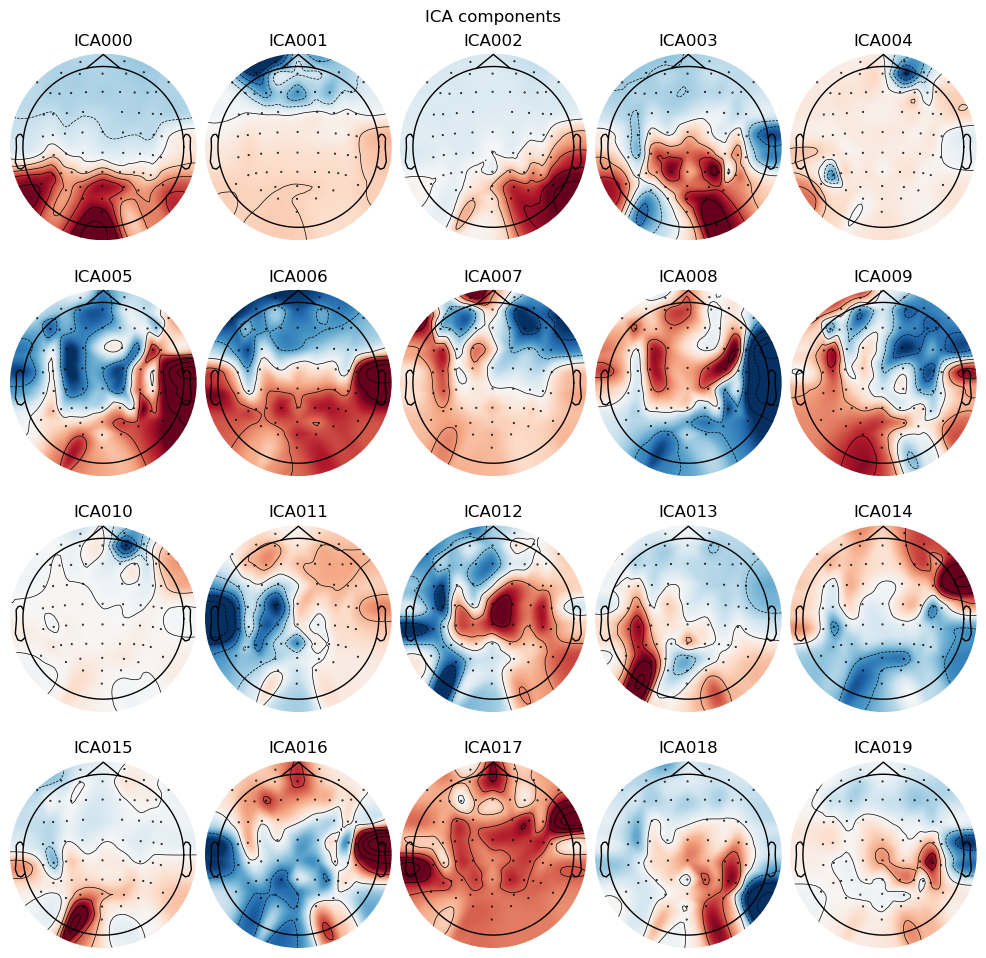

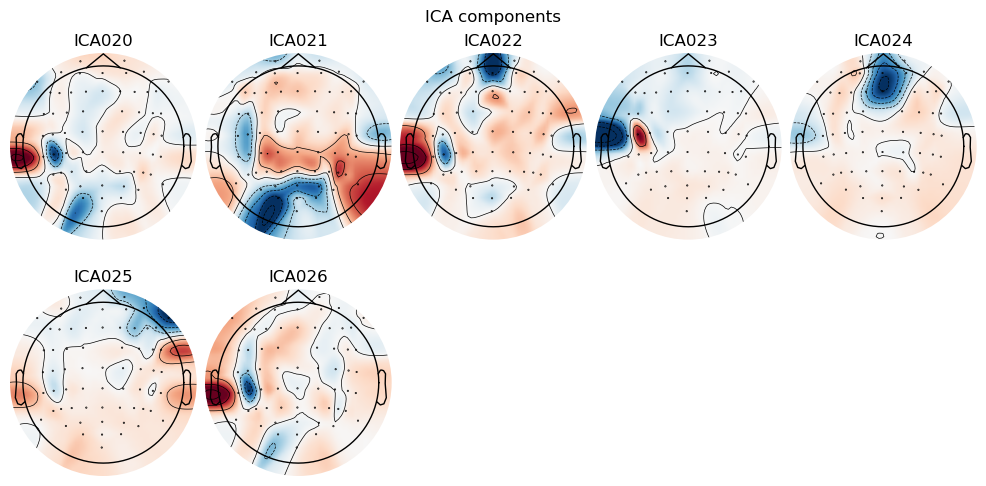

[<MNEFigure size 975x967 with 20 Axes>, <MNEFigure size 975x496 with 7 Axes>]

In [ ]:
explained_var_ratio = ica.get_explained_variance_ratio(raw_ica)
for channel_type, ratio in explained_var_ratio.items():
    print(
        f"Fraction of {channel_type} variance explained by all components: " f"{ratio}"
    )

# plot ICs
raw_ica.load_data()
ica.plot_sources(raw_ica, show_scrollbars=False)
ica.plot_components()

In [ ]:
component_dict = label_components(inst=raw_ica, ica=ica, method='iclabel')

<ipython-input-60-27b704a6dc63>:1: RuntimeWarning: The provided Raw instance is not filtered between 1 and 100 Hz. ICLabel was designed to classify features extracted from an EEG dataset bandpass filtered between 1 and 100 Hz (see the 'filter()' method for Raw and Epochs instances).
  component_dict = label_components(inst=raw_ica, ica=ica, method='iclabel')
<ipython-input-60-27b704a6dc63>:1: RuntimeWarning: The provided ICA instance was fitted with a 'fastica' algorithm. ICLabel was designed with extended infomax ICA decompositions. To use the extended infomax algorithm, use the 'mne.preprocessing.ICA' instance with the arguments 'ICA(method='infomax', fit_params=dict(extended=True))' (scikit-learn) or 'ICA(method='picard', fit_params=dict(ortho=False, extended=True))' (python-picard).
  component_dict = label_components(inst=raw_ica, ica=ica, method='iclabel')


In [ ]:
component_dict

{'y_pred_proba': array([0.99878836, 0.91477233, 0.9956721 , 0.99799305, 0.5410422 ,
        0.9158441 , 0.68759835, 0.6934593 , 0.8602844 , 0.81967217,
        0.44623303, 0.9911957 , 0.7049511 , 0.990713  , 0.5201963 ,
        0.79356045, 0.5833618 , 0.8737792 , 0.8250254 , 0.62889564,
        0.4831094 , 0.764228  , 0.6805266 , 0.87417704, 0.9117799 ,
        0.5332072 , 0.8715024 ], dtype=float32),
 'labels': ['brain',
  'eye blink',
  'brain',
  'brain',
  'other',
  'other',
  'brain',
  'eye blink',
  'other',
  'other',
  'other',
  'brain',
  'brain',
  'brain',
  'other',
  'brain',
  'other',
  'other',
  'brain',
  'brain',
  'other',
  'brain',
  'other',
  'muscle artifact',
  'other',
  'eye blink',
  'other']}

In [ ]:
# Print the results
print("Predicted Probabilities:", component_dict['y_pred_proba'])
print("Component Labels:", component_dict['labels'])

# Extract the labels and probabilities
labels = component_dict['labels']
probabilities = component_dict['y_pred_proba']

# Identify components to exclude (not labeled as 'brain' with probability >= 0.5)
exclude_components = [
    idx for idx, (label, prob) in enumerate(zip(labels, probabilities))
    if label != 'brain' or prob < 0.5
]

# Print excluded components for verification
print(f"Excluding components: {exclude_components}")

Predicted Probabilities: [0.99878836 0.91477233 0.9956721  0.99799305 0.5410422  0.9158441
 0.68759835 0.6934593  0.8602844  0.81967217 0.44623303 0.9911957
 0.7049511  0.990713   0.5201963  0.79356045 0.5833618  0.8737792
 0.8250254  0.62889564 0.4831094  0.764228   0.6805266  0.87417704
 0.9117799  0.5332072  0.8715024 ]
Component Labels: ['brain', 'eye blink', 'brain', 'brain', 'other', 'other', 'brain', 'eye blink', 'other', 'other', 'other', 'brain', 'brain', 'brain', 'other', 'brain', 'other', 'other', 'brain', 'brain', 'other', 'brain', 'other', 'muscle artifact', 'other', 'eye blink', 'other']
Excluding components: [1, 4, 5, 7, 8, 9, 10, 14, 16, 17, 20, 22, 23, 24, 25, 26]


In [ ]:
ica.exclude = exclude_components
raw_cleaned = ica.apply(raw_resampled_line_reref_interp_filt.copy())

Applying ICA to Raw instance
    Transforming to ICA space (27 components)
    Zeroing out 16 ICA components
    Projecting back using 64 PCA components


In [ ]:
raw_cleaned.plot()

Using pyopengl with version 3.1.6


In [ ]:
# Plot data before ICA cleaning
raw_resampled_line_reref_interp_filt.plot(title="Before ICA Cleaning")

# Plot data after ICA cleaning
raw_cleaned.plot(title="After ICA Cleaning")

Using pyopengl with version 3.1.6
Using pyopengl with version 3.1.6


Channels marked as bad:
none
Channels marked as bad:
none
Channels marked as bad:
none


NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 8.192 (s)
Plotting power spectral density (dB=True).


/Users/denizyilmaz/miniconda3/envs/mne/lib/python3.12/site-packages/mne/viz/utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


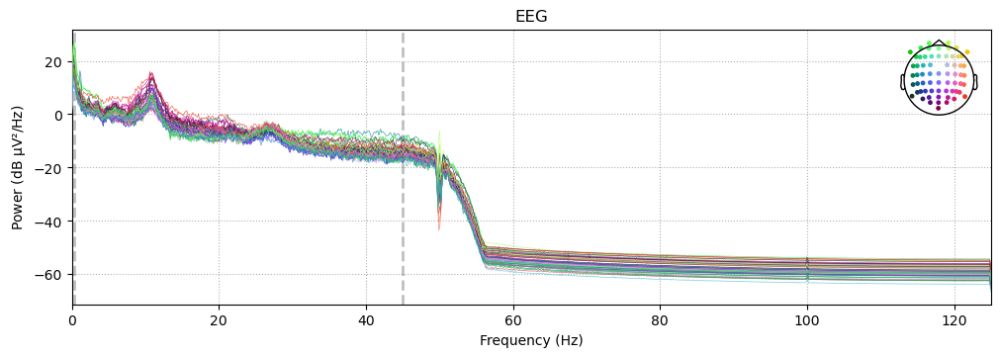

In [ ]:
raw_resampled_line_reref_interp_filt.plot_psd()

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 8.192 (s)
Plotting power spectral density (dB=True).


/Users/denizyilmaz/miniconda3/envs/mne/lib/python3.12/site-packages/mne/viz/utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


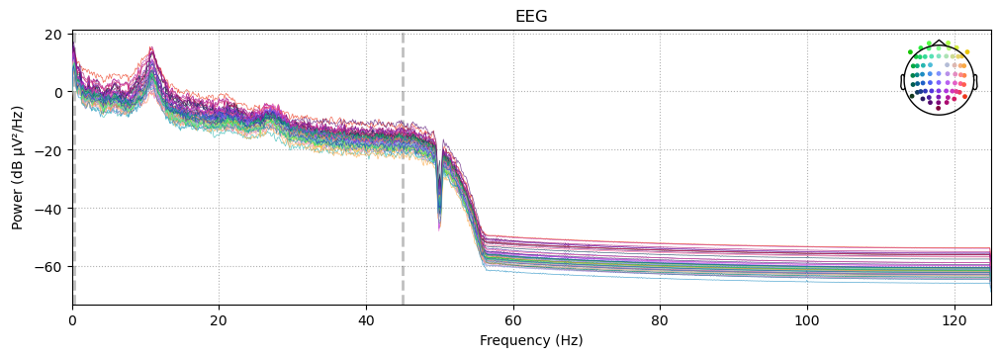

In [ ]:
raw_cleaned.plot_psd()

Applying ICA to Raw instance
    Transforming to ICA space (27 components)
    Zeroing out 16 ICA components
    Projecting back using 64 PCA components


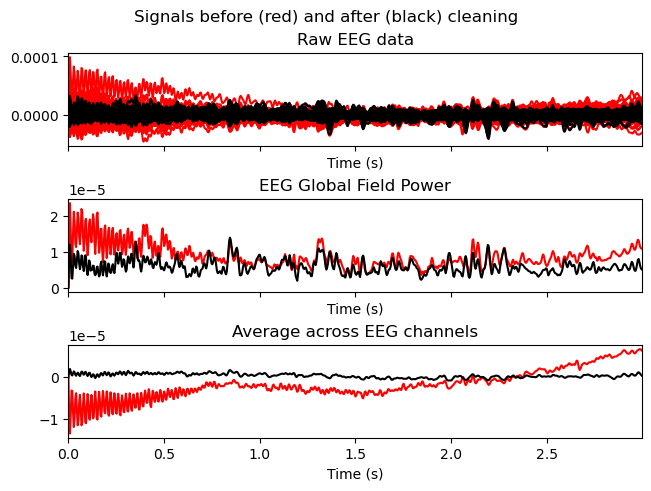

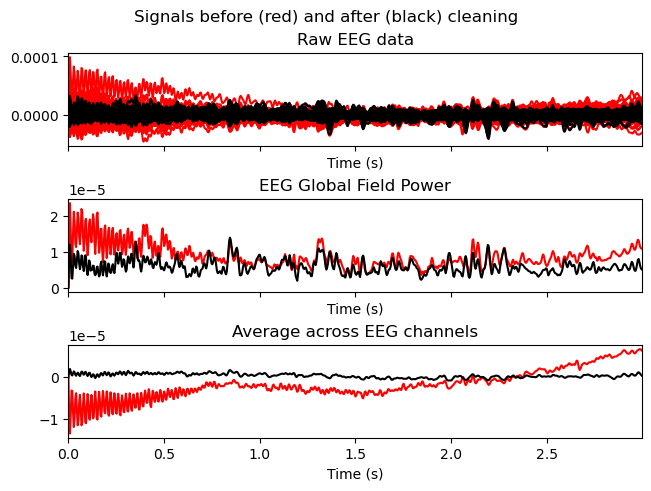

In [ ]:
ica.plot_overlay(raw_resampled_line_reref_interp_filt, exclude=ica.exclude)

In [ ]:
# read data that you already put in your wd
#raw = mne.io.read_raw("BTSCZ008_V1_eyes-open.vhdr", preload=True)
raw = mne.io.read_raw("test_r_net_eo.vhdr", preload=True)


# alternative way of reading data
# raw = mne.io.read_raw_brainvision("BTSCZ009_V1_eyes-open.vhdr", preload=True, scale=1)
# read_raw_brainvision(scale=1e6)

# inspect data visually
raw.plot()

Extracting parameters from test_r_net_eo.vhdr...
Setting channel info structure...
Reading 0 ... 157919  =      0.000 ...   315.838 secs...


<ipython-input-72-da3fda6e6fe9>:3: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = mne.io.read_raw("test_r_net_eo.vhdr", preload=True)


Using pyopengl with version 3.1.6


Channels marked as bad:
none


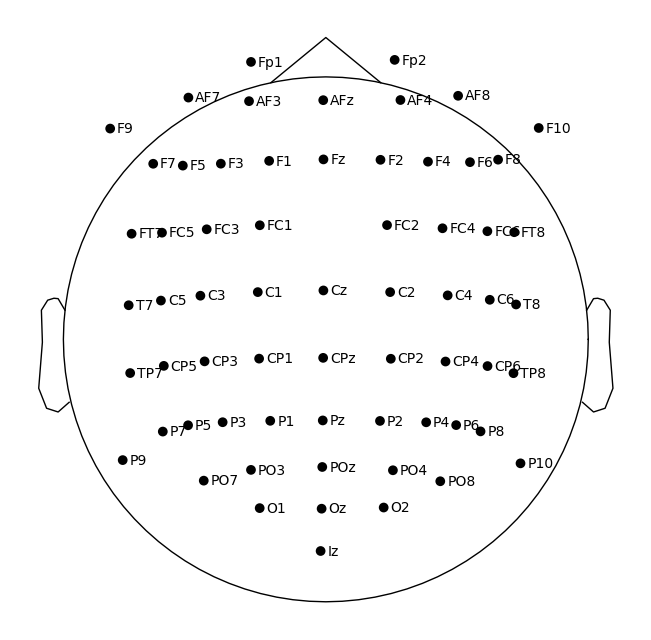

250.0


In [ ]:
montage = mne.channels.make_standard_montage('standard_1020')

# Apply the montage to your raw data
raw.set_montage(montage)

# plot montage
raw.plot_sensors(show_names=True)


# %% 4. Resampling to 250 Hz, by 2 bc the initial sampling is 500

# Define the new sampling rate you want
new_sampling_rate = 250 

# Resample the EEG data to the new sampling rate
raw_resampled = raw.copy()
raw_resampled.resample(sfreq=new_sampling_rate)

print(raw_resampled.info["sfreq"])

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 4.096 (s)
Plotting power spectral density (dB=True).


<ipython-input-74-a5fcf744740b>:1: UserWarning: Zero value in spectrum for channels CP1, P3, C4, Cz, AF8
  raw.plot_psd()
<ipython-input-74-a5fcf744740b>:1: UserWarning: Infinite value in PSD for channels CP1, P3, C4, Cz, AF8.
These channels might be dead.
  raw.plot_psd()
/Users/denizyilmaz/miniconda3/envs/mne/lib/python3.12/site-packages/mne/viz/utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


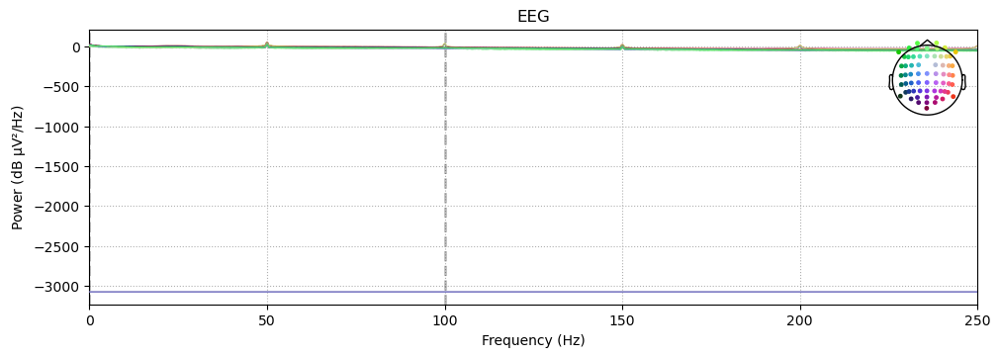

In [ ]:
raw.plot_psd()

In [ ]:
raw.plot()

Using pyopengl with version 3.1.6


Channels marked as bad:
none


In [ ]:
raw.describe()
print(type(raw._data))
print(raw._data.shape)

<RawBrainVision | test_r_net_eo.eeg, 64 x 157920 (315.8 s), ~77.2 MiB, data loaded>
ch  name  type  unit        min         Q1     median         Q3        max
 0  Fp1   EEG   µV     -3276.80   -3276.70   -3276.70   -2997.20   -2519.30
 1  Fz    EEG   µV      -548.10    -392.20    -326.00    -220.60     353.60
 2  F3    EEG   µV      -254.50    -123.00     -67.40      82.70     574.70
 3  F7    EEG   µV     -3276.80   -3276.70   -3276.70   -3276.70   -2960.80
 4  F9    EEG   µV      -668.60    -361.00    -232.50     -15.80    1080.00
 5  FC5   EEG   µV      1159.00    1568.90    1722.60    1950.52    2607.50
 6  FC1   EEG   µV     -1592.20   -1496.20   -1418.60   -1144.90    -864.80
 7  C3    EEG   µV     -3048.90   -2970.60   -2851.60   -2516.50   -2239.80
 8  T7    EEG   µV     -3276.80   -3276.70   -3276.70   -3160.67   -2730.10
 9  CP5   EEG   µV     -1115.80    -967.40    -859.40    -614.70    -304.70
10  CP1   EEG   µV      3276.70    3276.70    3276.70    3276.70    3276.70
11  

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 4.096 (s)
Plotting power spectral density (dB=True).


<ipython-input-77-a5fcf744740b>:1: UserWarning: Zero value in spectrum for channels CP1, P3, C4, Cz, AF8
  raw.plot_psd()
<ipython-input-77-a5fcf744740b>:1: UserWarning: Infinite value in PSD for channels CP1, P3, C4, Cz, AF8.
These channels might be dead.
  raw.plot_psd()
/Users/denizyilmaz/miniconda3/envs/mne/lib/python3.12/site-packages/mne/viz/utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


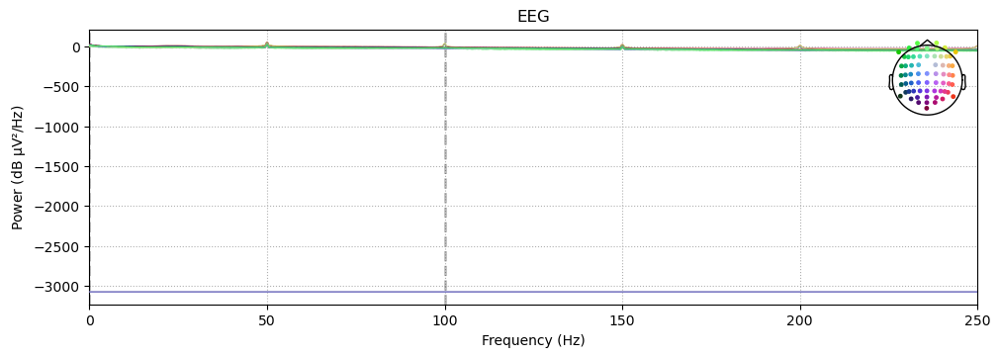

In [ ]:
raw.plot_psd()

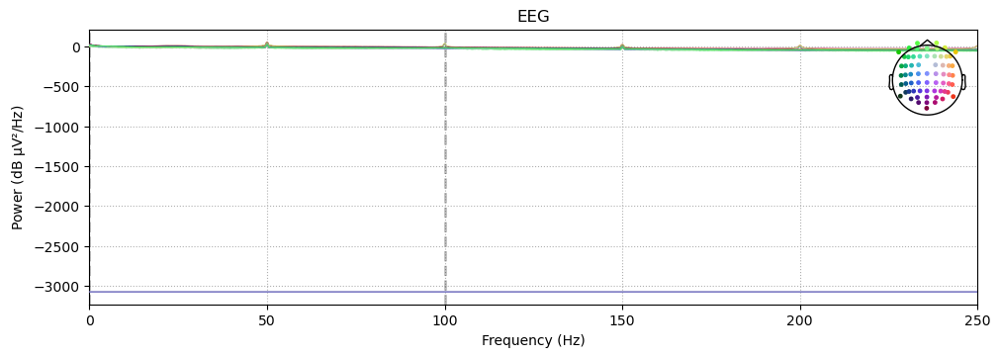

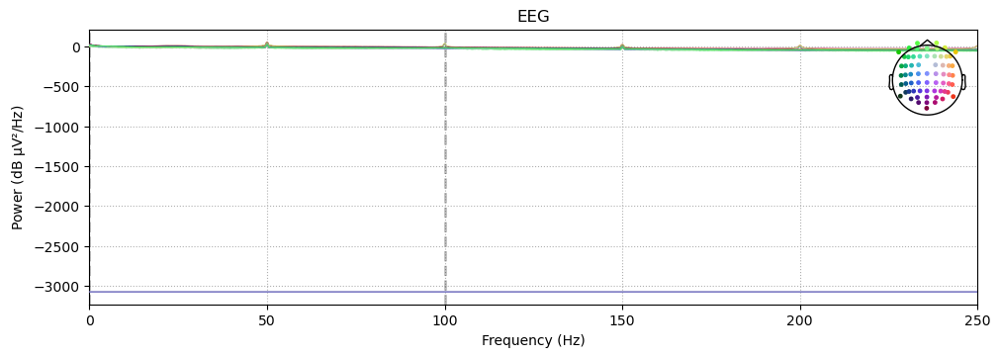

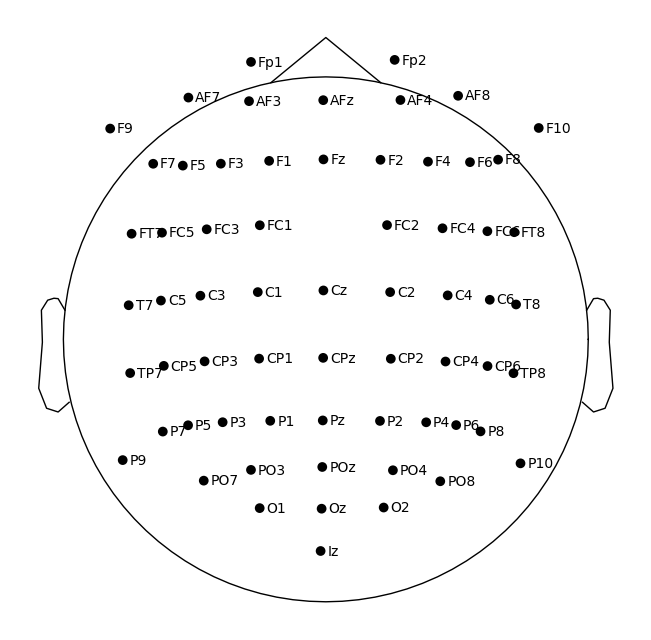

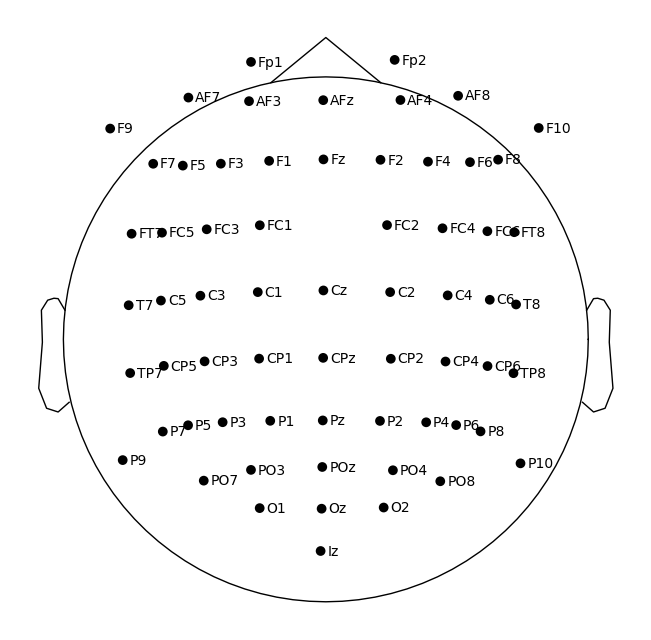

In [ ]:
montage = mne.channels.make_standard_montage('standard_1020')

# Apply the montage to your raw data
raw.set_montage(montage)

# plot montage
raw.plot_sensors(show_names=True)

In [ ]:
new_sampling_rate = 250 

# Resample the EEG data to the new sampling rate
raw_resampled = raw.copy()
raw_resampled.resample(sfreq=new_sampling_rate)

print(raw_resampled.info["sfreq"])

250.0


Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 49 - 51 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 49.38
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 49.12 Hz)
- Upper passband edge: 50.62 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 50.88 Hz)
- Filter length: 1651 samples (6.604 s)

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 8.192 (s)
Plotting power spectral density (dB=True).


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
/Users/denizyilmaz/miniconda3/envs/mne/lib/python3.12/site-packages/mne/viz/utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


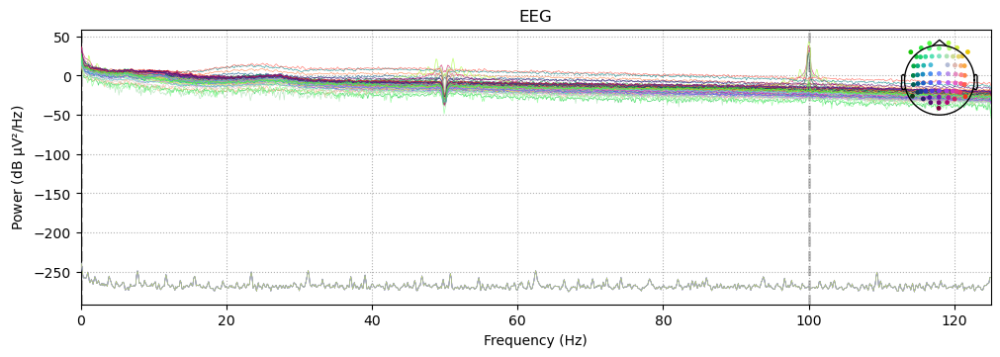

In [ ]:
# Apply notch filter to remove line noise (e.g., 50 Hz from Antonin's manuscript)
line_freq = 50  # Set the line frequency to 50, as Antonin did: 
raw_resampled_line= raw_resampled.copy()
raw_resampled_line.notch_filter(freqs=line_freq)  # Apply notch filter to EEG channels only ?? OR: 49.5 to 50.5 in a method ??
# Plot the data to visualize the effect of the notch filter
raw_resampled_line.plot_psd()

EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
Using pyopengl with version 3.1.6
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 8.192 (s)
Plotting power spectral density (dB=True).


/Users/denizyilmaz/miniconda3/envs/mne/lib/python3.12/site-packages/mne/viz/utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


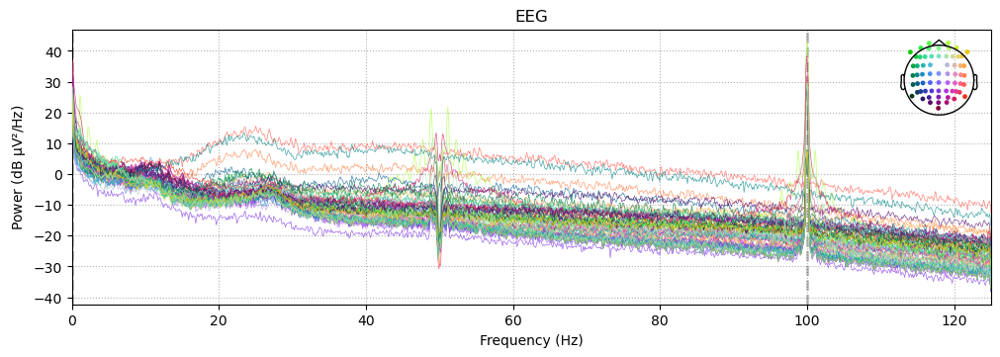

Channels marked as bad:
none


In [ ]:
# B.Robust average rereferencing
raw_resampled_line_reref = raw_resampled_line.copy()
raw_resampled_line_reref.set_eeg_reference(ref_channels='average')
raw_resampled_line_reref.plot()
raw_resampled_line_reref.plot_psd()

In [ ]:
raw_resampled_line_reref_interp = raw_resampled_line_reref.copy()
# Assign the mne object to the NoisyChannels class. The resulting object will be the place where all following methods are performed.
noisy_data = NoisyChannels(raw_resampled_line_reref, random_state=1337)
# find bad by corr
noisy_data.find_bad_by_correlation()
print("Bad channels by correlation:", noisy_data.bad_by_correlation)
# find bad by deviation
noisy_data.find_bad_by_deviation()
print("Bad channels by deviation:", noisy_data.bad_by_deviation)

NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 825 samples (3.300 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Bad channels by correlation: ['Fp2', 'C5', 'PO8', 'TP8']
Bad channels by deviation: ['Fp2', 'C5', 'PO8', 'TP8', 'AF4']


In [ ]:
noisy_data.find_bad_by_ransac(channel_wise=True, max_chunk_size=1) 
print("Bad channels by RANSAC:", noisy_data.bad_by_ransac)

Executing RANSAC
This may take a while, so be patient...
Finding optimal chunk size : 1
Total # of chunks: 59
Current chunk:
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59

RANSAC done!
Bad channels by RANSAC: [np.str_('Fp1'), np.str_('F7'), np.str_('F9'), np.str_('T7'), np.str_('CP5'), np.str_('CP1'), np.str_('Pz'), np.str_('P3'), np.str_('T8'), np.str_('C4'), np.str_('FC2'), np.str_('FC6'), np.str_('AFz'), np.str_('F5'), np.str_('FC3'), np.str_('C1'), np.str_('P6'), np.str_('CP4'), np.str_('FT8'), np.str_('F6'), np.str_('AF8')]


In [ ]:
raw_resampled_line_reref_interp.info["bads"] = noisy_data.get_bads()
bads = noisy_data.get_bads()

In [ ]:
bads

[np.str_('F5'),
 np.str_('F9'),
 np.str_('C4'),
 np.str_('F7'),
 'Fp2',
 np.str_('T8'),
 np.str_('FC2'),
 'AF4',
 np.str_('P6'),
 np.str_('AF8'),
 'TP8',
 np.str_('CP1'),
 np.str_('T7'),
 np.str_('FC6'),
 np.str_('CP4'),
 np.str_('C1'),
 np.str_('FT8'),
 np.str_('AFz'),
 'PO8',
 np.str_('Fp1'),
 np.str_('Pz'),
 np.str_('P3'),
 np.str_('CP5'),
 np.str_('FC3'),
 np.str_('F6'),
 'C5']

Setting channel interpolation method to {'eeg': 'spline'}.
Interpolating bad channels.
    Automatic origin fit: head of radius 95.9 mm
Computing interpolation matrix from 38 sensor positions
Interpolating 26 sensors
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 8.192 (s)
Plotting power spectral density (dB=True).


/Users/denizyilmaz/miniconda3/envs/mne/lib/python3.12/site-packages/mne/viz/utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


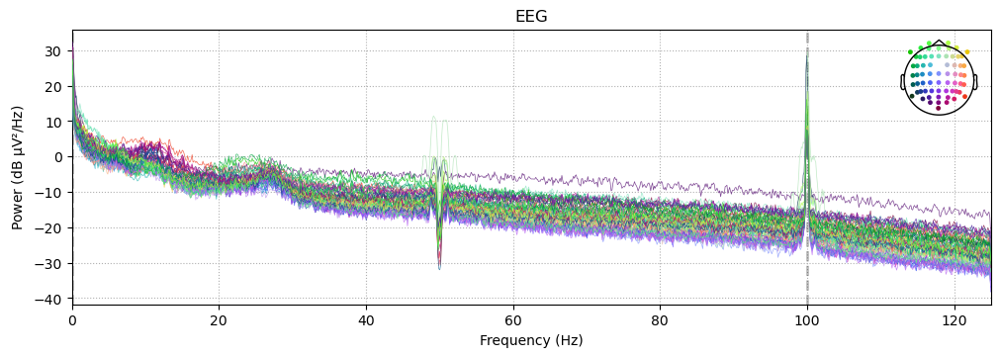

In [ ]:
raw_resampled_line_reref_interp.interpolate_bads()
# plot psd
raw_resampled_line_reref_interp.plot_psd()

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.3 - 45 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.30
- Lower transition bandwidth: 0.30 Hz (-6 dB cutoff frequency: 0.15 Hz)
- Upper passband edge: 45.00 Hz
- Upper transition bandwidth: 11.25 Hz (-6 dB cutoff frequency: 50.62 Hz)
- Filter length: 2751 samples (11.004 s)

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 8.192 (s)
Plotting power spectral density (dB=True).


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
/Users/denizyilmaz/miniconda3/envs/mne/lib/python3.12/site-packages/mne/viz/utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


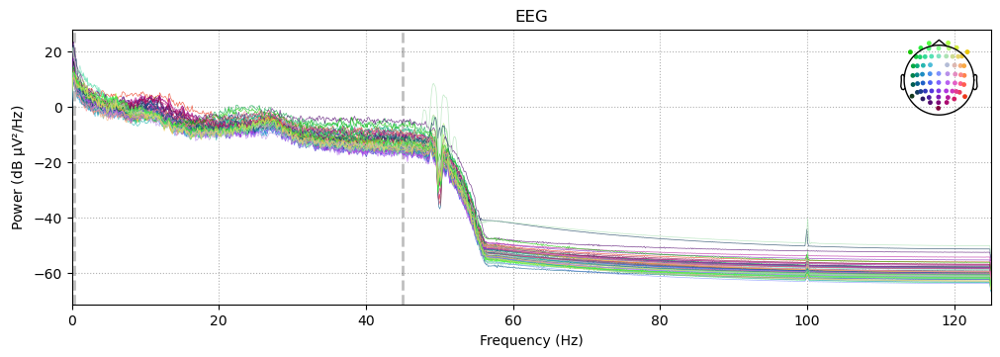

In [ ]:
raw_resampled_line_reref_interp_filt = raw_resampled_line_reref_interp.copy()
# Define the bandpass filter frequency range
low_freq = 0.3  # Lower cutoff frequency (in Hz)
#low_freq = 1
high_freq = 45.0  # Upper cutoff frequency (in Hz)
# Apply the bandpass filter
raw_resampled_line_reref_interp_filt.filter(l_freq=low_freq, h_freq=high_freq, method='fir', phase='zero') # check method and phase
# plot psd
raw_resampled_line_reref_interp_filt.plot_psd()

Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 825 samples (3.300 s)

Fitting ICA to data using 64 channels (please be patient, this may take a while)
Selecting by number: 27 components


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Fitting ICA took 0.8s.
Fraction of eeg variance explained by all components: 0.991835187077997
Creating RawArray with float64 data, n_channels=27, n_times=78960
    Range : 0 ... 78959 =      0.000 ...   315.836 secs
Ready.
Using pyopengl with version 3.1.6


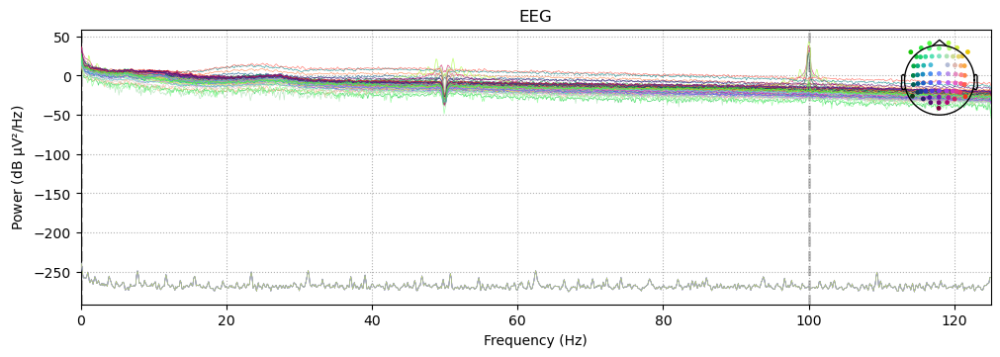

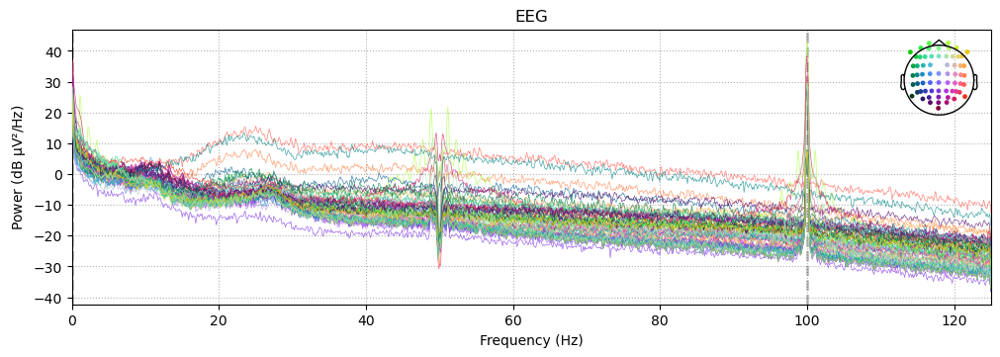

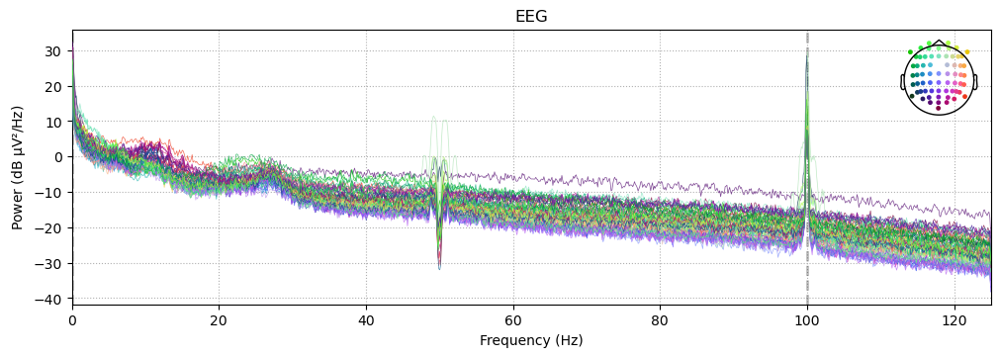

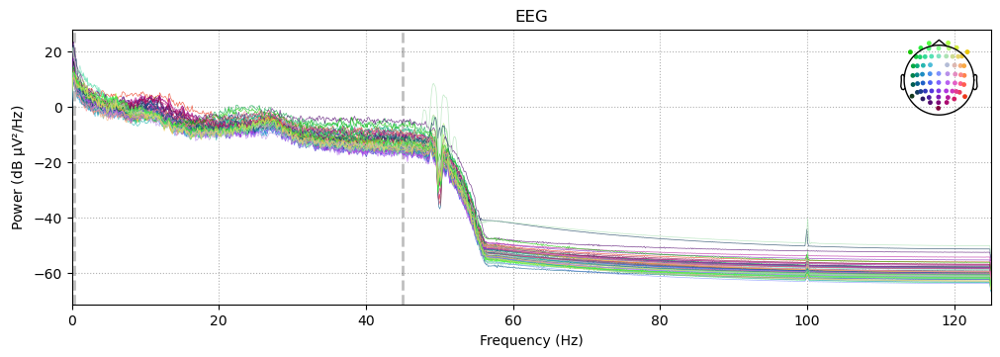

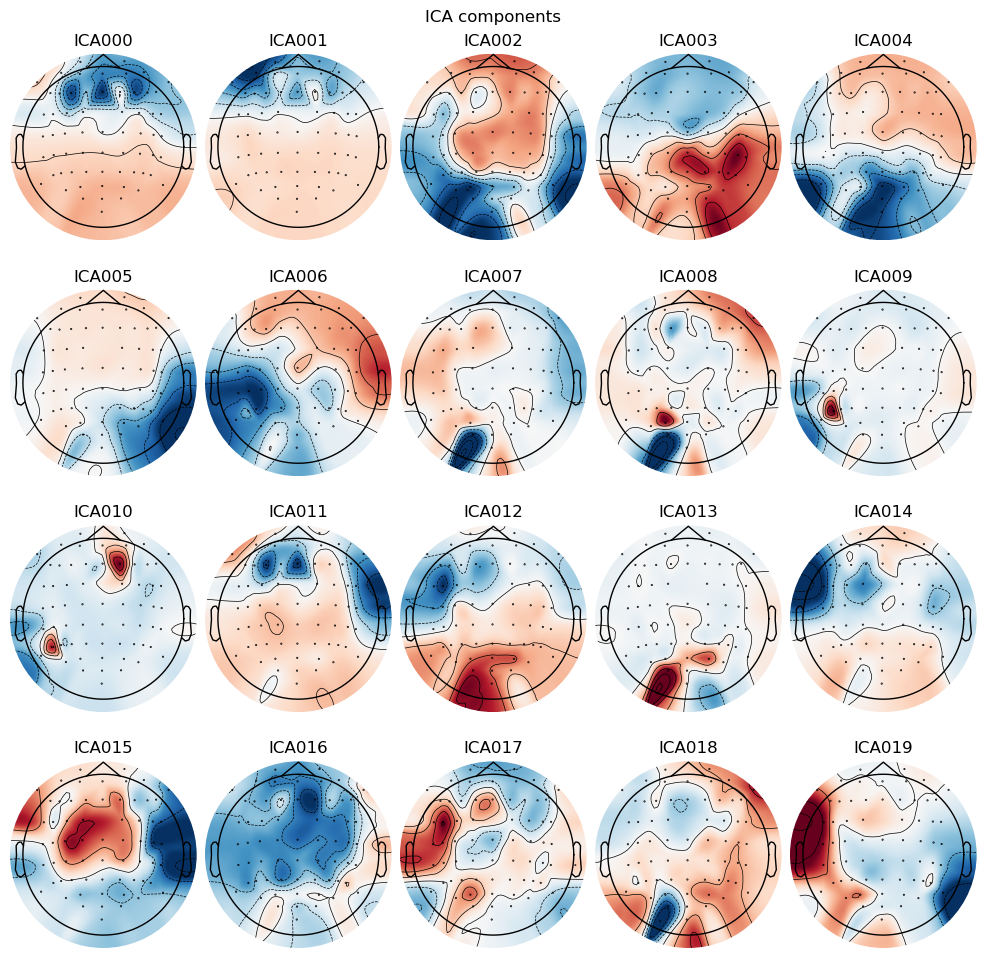

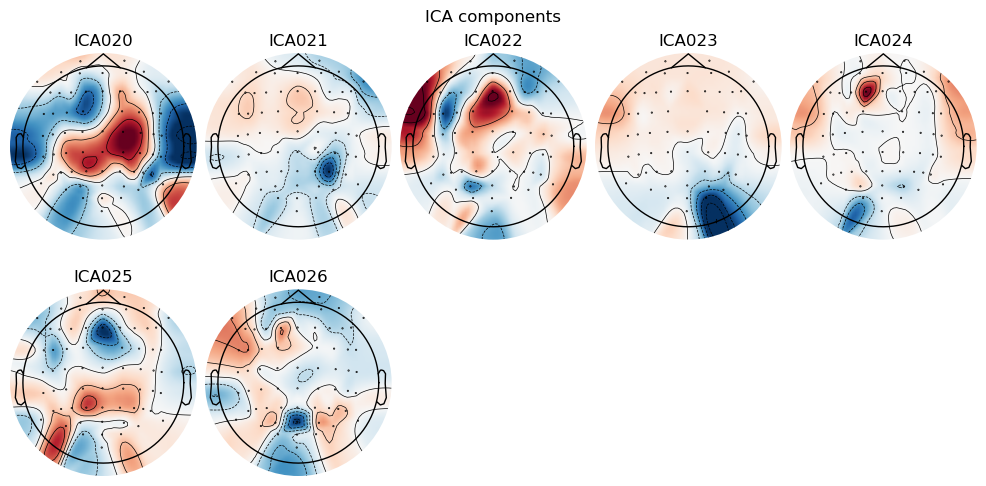

<ipython-input-88-a79fea04382c>:24: RuntimeWarning: The provided Raw instance is not filtered between 1 and 100 Hz. ICLabel was designed to classify features extracted from an EEG dataset bandpass filtered between 1 and 100 Hz (see the 'filter()' method for Raw and Epochs instances).
  component_dict = label_components(inst=raw_ica, ica=ica, method='iclabel')
<ipython-input-88-a79fea04382c>:24: RuntimeWarning: The provided ICA instance was fitted with a 'fastica' algorithm. ICLabel was designed with extended infomax ICA decompositions. To use the extended infomax algorithm, use the 'mne.preprocessing.ICA' instance with the arguments 'ICA(method='infomax', fit_params=dict(extended=True))' (scikit-learn) or 'ICA(method='picard', fit_params=dict(ortho=False, extended=True))' (python-picard).
  component_dict = label_components(inst=raw_ica, ica=ica, method='iclabel')


Predicted Probabilities: [0.85247606 0.6579784  0.6536806  0.9861592  0.994418   0.9812523
 0.98713934 0.8240678  0.75431645 0.8743228  0.76755285 0.5947161
 0.92218167 0.3600278  0.7673053  0.5588993  0.9252184  0.54887325
 0.8268052  0.88815975 0.5169287  0.7424939  0.6920848  0.9579877
 0.53317463 0.956108   0.8635227 ]
Component Labels: ['brain', 'eye blink', 'brain', 'brain', 'brain', 'brain', 'brain', 'other', 'other', 'other', 'other', 'brain', 'brain', 'other', 'muscle artifact', 'other', 'other', 'brain', 'other', 'other', 'other', 'other', 'other', 'brain', 'other', 'other', 'other']
Excluding components: [1, 7, 8, 9, 10, 13, 14, 15, 16, 18, 19, 20, 21, 22, 24, 25, 26]


In [ ]:
raw_ica = raw_resampled_line_reref_interp_filt.copy().filter(l_freq=1.0, h_freq=None)
# you can try and see lower for heart artifacts but other components may get worse
#raw_ica = raw_resampled_line_reref_interp_filt.copy().filter(l_freq=0.1, h_freq=None)


# set up and fit the ICA
ica = ICA(n_components=27, max_iter="auto", random_state=97) # initially 30
ica.fit(raw_ica)
ica

# print explained vars for ICAs
explained_var_ratio = ica.get_explained_variance_ratio(raw_ica)
for channel_type, ratio in explained_var_ratio.items():
    print(
        f"Fraction of {channel_type} variance explained by all components: " f"{ratio}"
    )

# plot ICs
raw_ica.load_data()
ica.plot_sources(raw_ica, show_scrollbars=False)
ica.plot_components()

# Automatically label components using the 'iclabel' method
component_dict = label_components(inst=raw_ica, ica=ica, method='iclabel')
# component_labels gives the labels

# Print the results
print("Predicted Probabilities:", component_dict['y_pred_proba'])
print("Component Labels:", component_dict['labels'])

# Extract the labels and probabilities
labels = component_dict['labels']
probabilities = component_dict['y_pred_proba']

# Identify components to exclude (not labeled as 'brain' with probability >= 0.5)
exclude_components = [
    idx for idx, (label, prob) in enumerate(zip(labels, probabilities))
    if label != 'brain' or prob < 0.5
]

# Print excluded components for verification
print(f"Excluding components: {exclude_components}")

In [ ]:
# Remove the identified components from the preprocessed data
ica.exclude = exclude_components
raw_cleaned = ica.apply(raw_resampled_line_reref_interp_filt.copy())

# Plot the cleaned data
raw_cleaned.plot()

Applying ICA to Raw instance
    Transforming to ICA space (27 components)
    Zeroing out 17 ICA components
    Projecting back using 64 PCA components
Using pyopengl with version 3.1.6


Channels marked as bad:
none


In [ ]:
raw_resampled_line_reref_interp_filt.plot(title="Before ICA Cleaning")

# Plot data after ICA cleaning
raw_cleaned.plot(title="After ICA Cleaning")

Using pyopengl with version 3.1.6
Using pyopengl with version 3.1.6


Channels marked as bad:
none
Channels marked as bad:
none


NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 8.192 (s)
Plotting power spectral density (dB=True).
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 8.192 (s)
Plotting power spectral density (dB=True).


/Users/denizyilmaz/miniconda3/envs/mne/lib/python3.12/site-packages/mne/viz/utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)
/Users/denizyilmaz/miniconda3/envs/mne/lib/python3.12/site-packages/mne/viz/utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


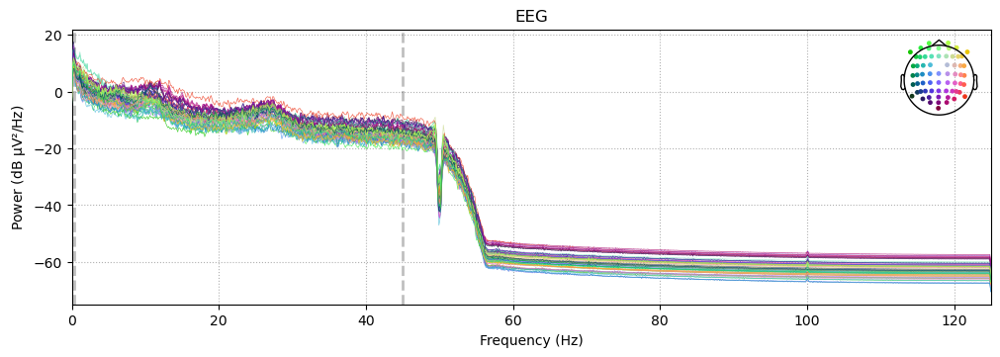

In [ ]:
# Compare PSD before and after ICA cleaning
raw_resampled_line_reref_interp_filt.plot_psd()
raw_cleaned.plot_psd()

Applying ICA to Raw instance
    Transforming to ICA space (27 components)
    Zeroing out 17 ICA components
    Projecting back using 64 PCA components


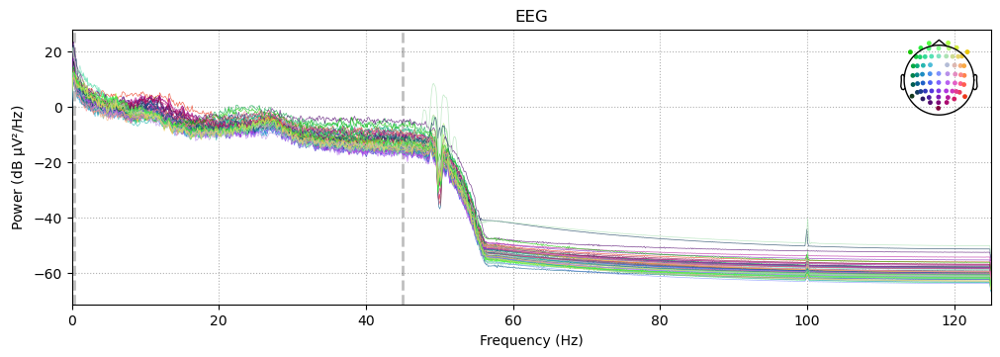

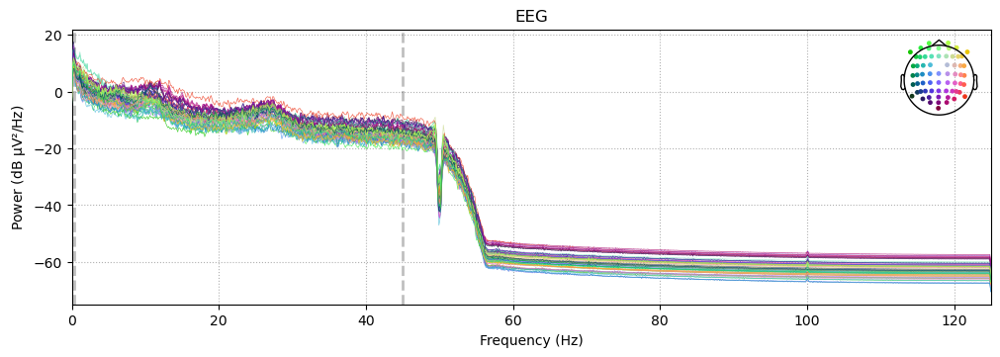

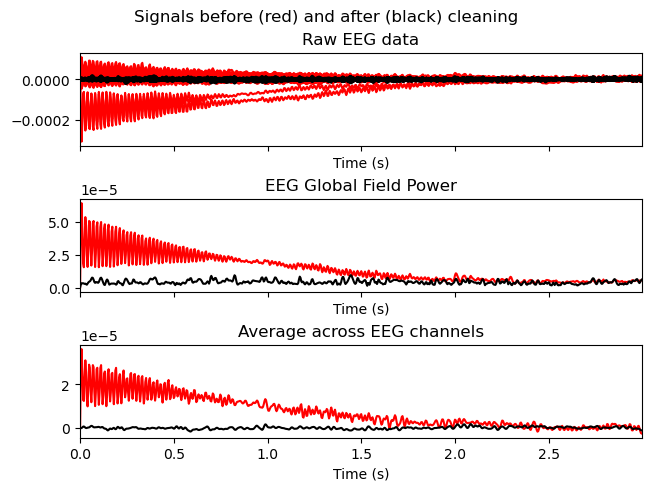

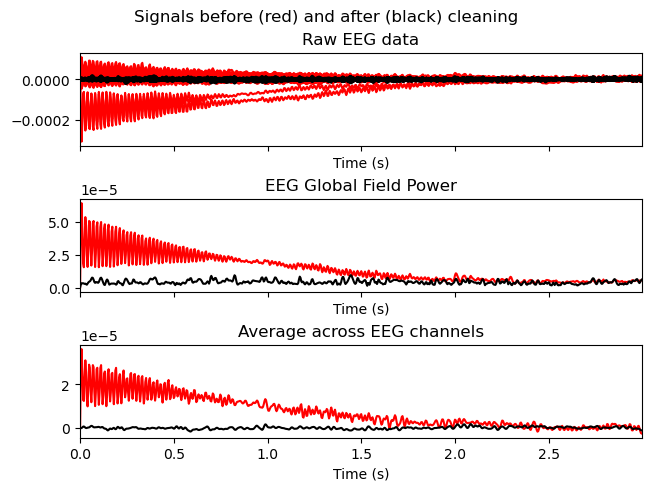

In [ ]:
ica.plot_overlay(raw_resampled_line_reref_interp_filt, exclude=ica.exclude)

In [ ]:
# I run this to get the name of my file I want to read
os.listdir()

# read data that you already put in your wd
#raw = mne.io.read_raw("BTSCZ008_V1_eyes-open.vhdr", preload=True)
raw = mne.io.read_raw("test_slim_32_ec.vhdr", preload=True)


# alternative way of reading data
# raw = mne.io.read_raw_brainvision("BTSCZ009_V1_eyes-open.vhdr", preload=True, scale=1)
# read_raw_brainvision(scale=1e6)

# inspect data visually
raw.plot()

Extracting parameters from test_slim_32_ec.vhdr...
Setting channel info structure...
Reading 0 ... 138859  =      0.000 ...   277.718 secs...


<ipython-input-93-5e35869db428>:6: RuntimeWarning: Channels contain different highpass filters. Lowest (weakest) filter setting (0.00 Hz) will be stored.
  raw = mne.io.read_raw("test_slim_32_ec.vhdr", preload=True)
<ipython-input-93-5e35869db428>:6: RuntimeWarning: Channels contain different lowpass filters. Highest (weakest) filter setting (1000.00 Hz) will be stored.
  raw = mne.io.read_raw("test_slim_32_ec.vhdr", preload=True)


Using pyopengl with version 3.1.6


Channels marked as bad:
none


In [ ]:
# you can get specific info by calling an attribute like a dict
print(raw.info["sfreq"])  # u get sampling frequency
print(raw.info["bads"])  # u get the bad channels IF marked beforehand

500.0
[]


NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 4.096 (s)
Plotting power spectral density (dB=True).


<ipython-input-95-a5fcf744740b>:1: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  raw.plot_psd()
/Users/denizyilmaz/miniconda3/envs/mne/lib/python3.12/site-packages/mne/viz/utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


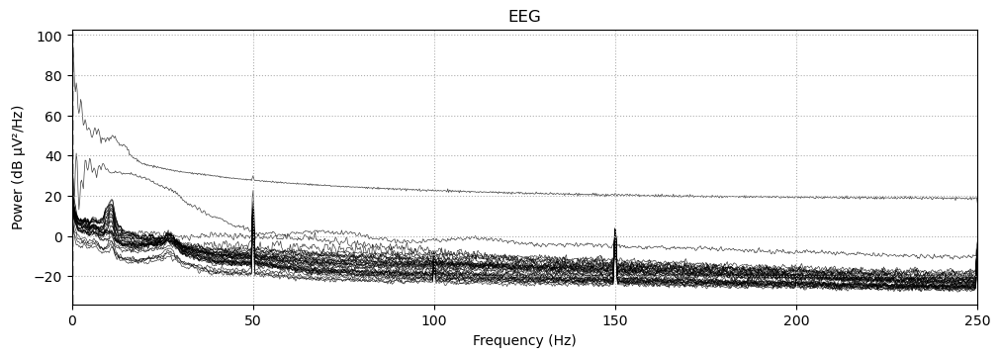

In [ ]:
raw.plot_psd()

In [ ]:
raw.describe()

<RawBrainVision | test_slim_32_ec.eeg, 33 x 138860 (277.7 s), ~35.0 MiB, data loaded>
ch  name  type  unit        min         Q1     median         Q3        max
 0  Fp1   EEG   µV      -230.50     -30.50     -15.50      -1.00     168.00
 1  Fp2   EEG   µV      -494.00     -18.50       1.00      19.50     191.00
 2  F7    EEG   µV      -118.50      -7.50       9.00      27.00     134.00
 3  F3    EEG   µV       -57.50       1.50       8.50      15.00      70.50
 4  Fz    EEG   µV       -85.00     -48.50     -41.50     -34.00       5.00
 5  F4    EEG   µV       -66.00     -23.50      25.50     106.50     191.00
 6  F8    EEG   µV      -250.50      10.50      19.00      27.50     121.00
 7  FC5   EEG   µV       -66.00       0.50       8.50      15.50      91.00
 8  FC1   EEG   µV      -115.50     -30.50     -25.00     -19.50      78.00
 9  FC2   EEG   µV       -47.50     -15.00     -11.50      -8.50      17.50
10  FC6   EEG   µV      -168.50     -32.00     -24.50     -17.00      85.50
11

In [ ]:
print(type(raw._data))
print(raw._data.shape)

<class 'numpy.ndarray'>
(33, 138860)


In [ ]:
channel_renaming = {
    'T3': 'T7',
    'T4': 'T8',
    'T5': 'P7',
    'T6': 'P8',
}

# Rename the channels using rename_channels
raw.rename_channels(channel_renaming)

# Check if "RESP" channel is present
if 'RESP' in raw.ch_names:
    # Define the channel type mapping
    channel_type_mapping = {
        'ECG': 'ecg',
        'RESP': 'resp'
    }
    
    # Set the channel types for "ECG" and "RESP" channels
    raw.set_channel_types(channel_type_mapping)
else:
    # Define the channel type mapping for only ECG channel if no RESP
    channel_type_mapping = {
        'ECG': 'ecg'
    }

    # Set the channel type for the "ECG" channel
    raw.set_channel_types(channel_type_mapping)

# Load the easycap-M1 montage (check if its truw by checking the cap)
montage = mne.channels.make_standard_montage('standard_1020')

# Apply the montage to your raw data
raw.set_montage(montage)

<RawBrainVision | test_slim_32_ec.eeg, 33 x 138860 (277.7 s), ~35.0 MiB, data loaded>

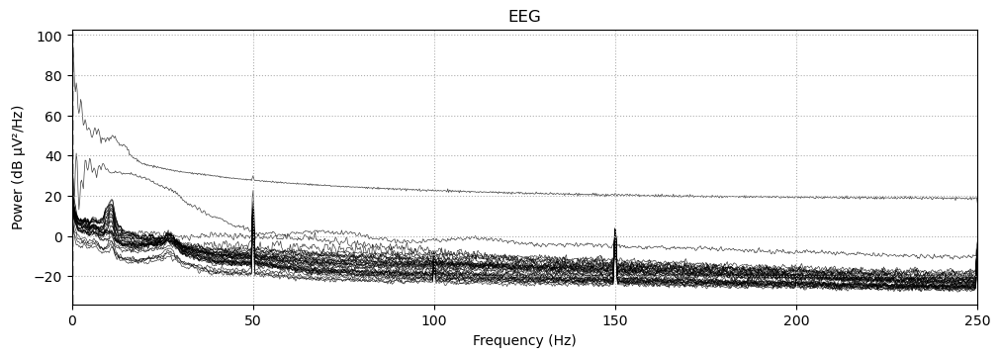

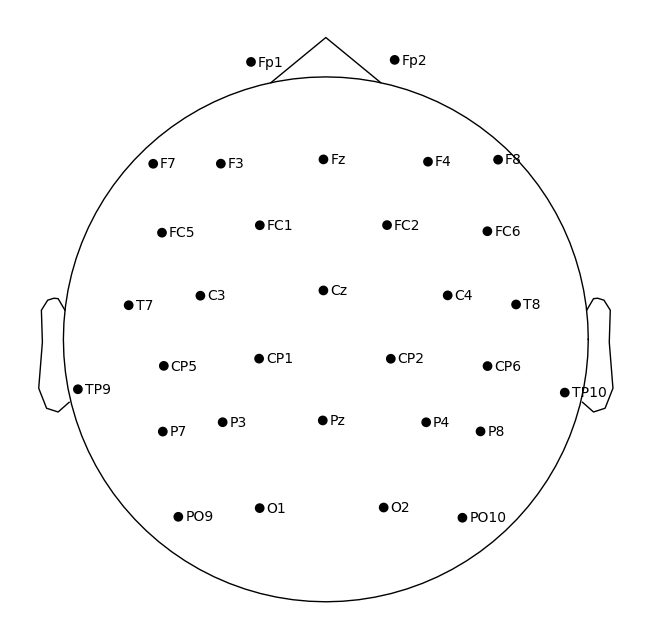

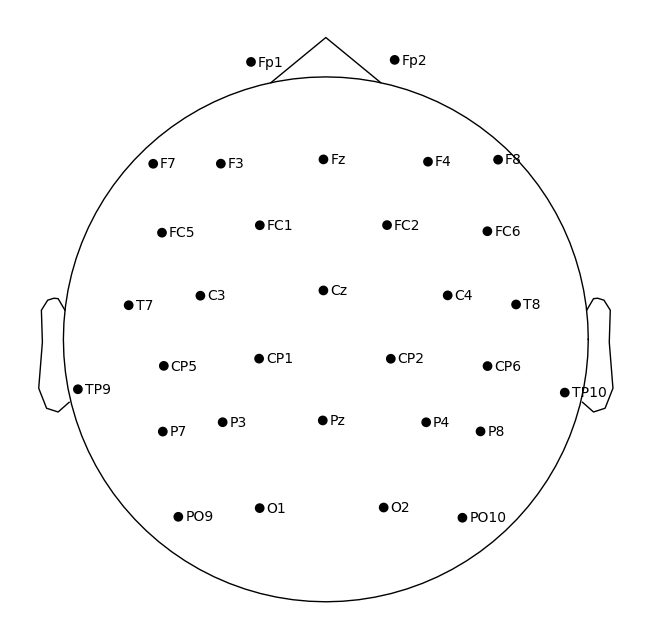

In [ ]:
# Load the easycap-M1 montage (check if its truw by checking the cap)
montage = mne.channels.make_standard_montage('standard_1020')

# Apply the montage to your raw data
raw.set_montage(montage)

# plot montage
raw.plot_sensors(show_names=True)

In [ ]:
new_sampling_rate = 250 

# Resample the EEG data to the new sampling rate
raw_resampled = raw.copy()
raw_resampled.resample(sfreq=new_sampling_rate)

print(raw_resampled.info["sfreq"])

250.0


In [ ]:
# find ECG events
ecg_events, _, _ = mne.preprocessing.find_ecg_events(raw_resampled, ch_name='ECG')
# play with the detection threshold and see if it performs better!

# Create annotations time-locked to R-peak with event descriptions
descriptions = ['R-peak'] * len(ecg_events)
R_peak_annotations = mne.Annotations(onset=ecg_events[:, 0] / raw_resampled.info['sfreq'],  # Convert sample indices to seconds
                              duration=0.0,  # Set the duration to zero for point events
                              description=descriptions)

# Define existing annotations
hct_annotations = raw.annotations.copy()

# Combine initial and R-peaks annotations
combined_annotations = mne.Annotations(
    onset=np.concatenate((hct_annotations.onset, R_peak_annotations.onset)),
    duration=np.concatenate((hct_annotations.duration, R_peak_annotations.duration)),
    description=np.concatenate((hct_annotations.description, R_peak_annotations.description))
)

# Apply annotations to raw data
raw_resampled.set_annotations(combined_annotations)

# Plot ECG with Annotations
raw_resampled.plot(n_channels=1, scalings={'ECG': 1e-3})
raw_resampled.plot(n_channels=1)

# YAY WORKS WELL UNTIL HERE!

# ecg_events.plot_image(combine="mean")

Using channel ECG to identify heart beats.
Setting up band-pass filter from 5 - 35 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 5.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 4.75 Hz)
- Upper passband edge: 35.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 35.25 Hz)
- Filter length: 2500 samples (10.000 s)

Number of ECG events detected : 352 (average pulse 76.0478179461328 / min.)
Using pyopengl with version 3.1.6
Using pyopengl with version 3.1.6


In [ ]:
# find ECG events
ecg_events, _, _ = mne.preprocessing.find_ecg_events(raw_resampled, ch_name='ECG')
# play with the detection threshold and see if it performs better!

# Create annotations time-locked to R-peak with event descriptions
descriptions = ['R-peak'] * len(ecg_events)
R_peak_annotations = mne.Annotations(onset=ecg_events[:, 0] / raw_resampled.info['sfreq'],  # Convert sample indices to seconds
                              duration=0.0,  # Set the duration to zero for point events
                              description=descriptions)

# Define existing annotations
hct_annotations = raw.annotations.copy()

# Combine initial and R-peaks annotations
combined_annotations = mne.Annotations(
    onset=np.concatenate((hct_annotations.onset, R_peak_annotations.onset)),
    duration=np.concatenate((hct_annotations.duration, R_peak_annotations.duration)),
    description=np.concatenate((hct_annotations.description, R_peak_annotations.description))
)

# Apply annotations to raw data
raw_resampled.set_annotations(combined_annotations)

# Plot ECG with Annotations
raw_resampled.plot(n_channels=1, scalings={'ECG': 1e-3})
raw_resampled.plot(n_channels=1)

Using channel ECG to identify heart beats.
Setting up band-pass filter from 5 - 35 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 5.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 4.75 Hz)
- Upper passband edge: 35.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 35.25 Hz)
- Filter length: 2500 samples (10.000 s)

Number of ECG events detected : 352 (average pulse 76.0478179461328 / min.)
Using pyopengl with version 3.1.6
Using pyopengl with version 3.1.6


In [ ]:
# Create a copy of the original RawBrainVision object
raw_eeg = raw_resampled.copy()

# Remove non-EEG channels
if 'RESP' in raw_eeg.ch_names:
    raw_eeg.drop_channels(['ECG', 'RESP'])
else:
    raw_eeg.drop_channels(['ECG'])

Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 49 - 51 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 49.38
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 49.12 Hz)
- Upper passband edge: 50.62 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 50.88 Hz)
- Filter length: 1651 samples (6.604 s)

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 8.192 (s)
Plotting power spectral density (dB=True).


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
/Users/denizyilmaz/miniconda3/envs/mne/lib/python3.12/site-packages/mne/viz/utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


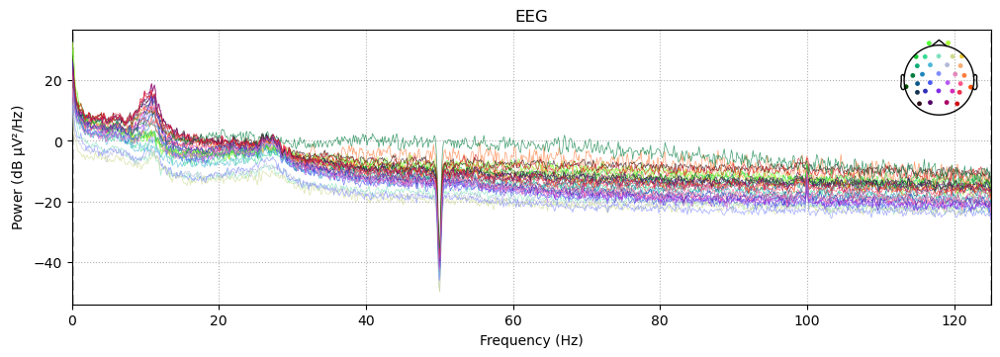

In [ ]:
# A. Remove line noise
# Apply notch filter to remove line noise (e.g., 50 Hz from Antonin's manuscript)
line_freq = 50  # Set the line frequency to 50, as Antonin did: 
raw_resampled_line= raw_resampled.copy()
raw_resampled_line.notch_filter(freqs=line_freq)  # Apply notch filter to EEG channels only ?? OR: 49.5 to 50.5 in a method ??
# Plot the data to visualize the effect of the notch filter
raw_resampled_line.plot_psd()

EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
Using pyopengl with version 3.1.6
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 8.192 (s)
Plotting power spectral density (dB=True).


/Users/denizyilmaz/miniconda3/envs/mne/lib/python3.12/site-packages/mne/viz/utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


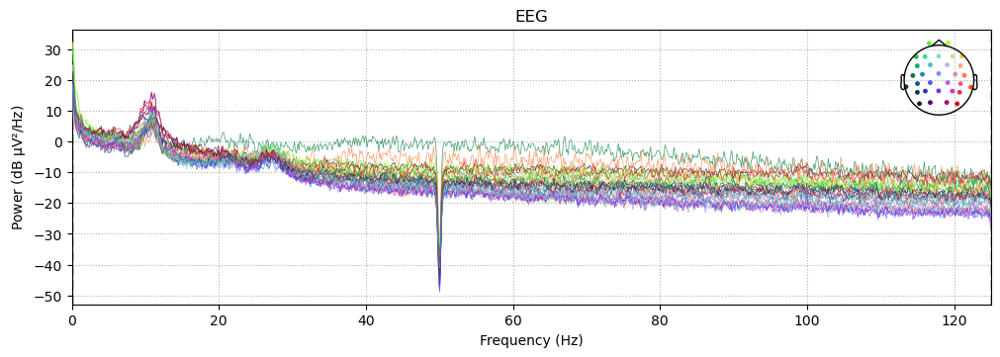

In [ ]:
raw_resampled_line_reref = raw_resampled_line.copy()
raw_resampled_line_reref.set_eeg_reference(ref_channels='average')
raw_resampled_line_reref.plot()
raw_resampled_line_reref.plot_psd()

In [ ]:
raw_resampled_line_reref_interp = raw_resampled_line_reref.copy()
# Assign the mne object to the NoisyChannels class. The resulting object will be the place where all following methods are performed.
noisy_data = NoisyChannels(raw_resampled_line_reref, random_state=1337)
# find bad by corr
noisy_data.find_bad_by_correlation()
print("Bad channels by correlation:", noisy_data.bad_by_correlation)
# find bad by deviation
noisy_data.find_bad_by_deviation()
print("Bad channels by deviation:", noisy_data.bad_by_deviation)

NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 825 samples (3.300 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Bad channels by correlation: ['T7', 'T8']
Bad channels by deviation: []


In [ ]:
#find bad by ransac: finds nothing, do I first have to mark bads from the methods before?  acc to Bigdely-Shamlo paper most bads are found in corr and dev
noisy_data.find_bad_by_ransac(channel_wise=True, max_chunk_size=1) 
print("Bad channels by RANSAC:", noisy_data.bad_by_ransac)

Executing RANSAC
This may take a while, so be patient...
Finding optimal chunk size : 1
Total # of chunks: 29
Current chunk:
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29

RANSAC done!
Bad channels by RANSAC: [np.str_('FC1')]


In [ ]:
raw_resampled_line_reref_interp.info["bads"] = noisy_data.get_bads()
bads = noisy_data.get_bads()

In [ ]:
bads

['T7', 'T8', np.str_('FC1')]

Setting channel interpolation method to {'eeg': 'spline'}.
Interpolating bad channels.
    Automatic origin fit: head of radius 97.0 mm
Computing interpolation matrix from 28 sensor positions
Interpolating 3 sensors
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 8.192 (s)
Plotting power spectral density (dB=True).


/Users/denizyilmaz/miniconda3/envs/mne/lib/python3.12/site-packages/mne/viz/utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


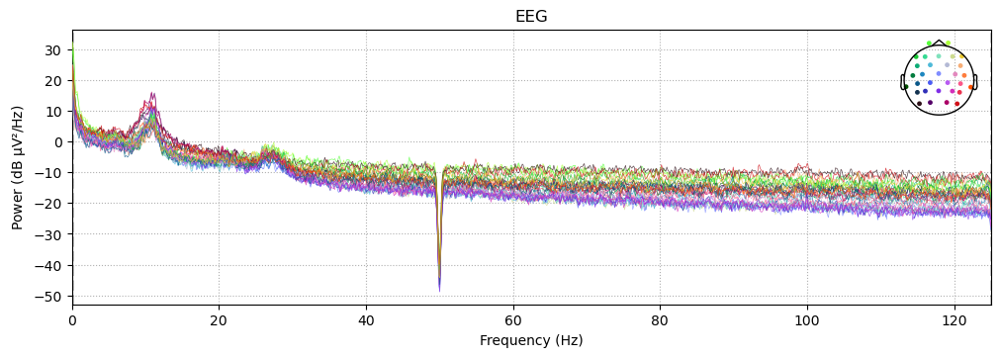

In [ ]:
# Interpolate noisy Channels
raw_resampled_line_reref_interp.interpolate_bads()
# plot psd
raw_resampled_line_reref_interp.plot_psd()

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.3 - 45 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.30
- Lower transition bandwidth: 0.30 Hz (-6 dB cutoff frequency: 0.15 Hz)
- Upper passband edge: 45.00 Hz
- Upper transition bandwidth: 11.25 Hz (-6 dB cutoff frequency: 50.62 Hz)
- Filter length: 2751 samples (11.004 s)

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 8.192 (s)
Plotting power spectral density (dB=True).


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
/Users/denizyilmaz/miniconda3/envs/mne/lib/python3.12/site-packages/mne/viz/utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


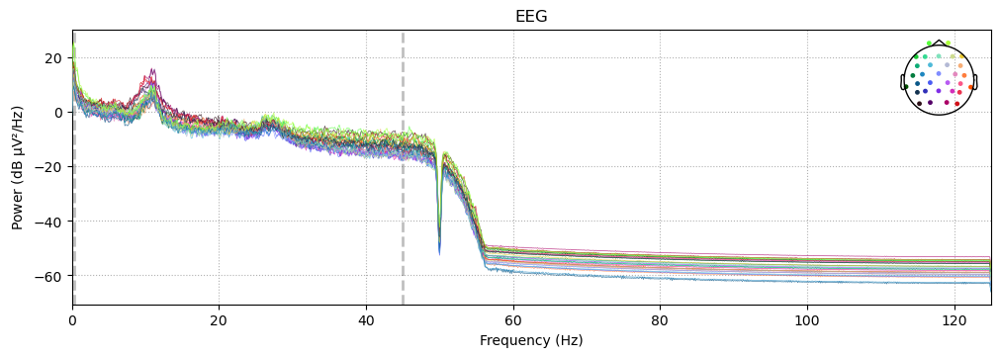

In [ ]:
raw_resampled_line_reref_interp_filt = raw_resampled_line_reref_interp.copy()
# Define the bandpass filter frequency range
low_freq = 0.3  # Lower cutoff frequency (in Hz)
#low_freq = 1
high_freq = 45.0  # Upper cutoff frequency (in Hz)
# Apply the bandpass filter
raw_resampled_line_reref_interp_filt.filter(l_freq=low_freq, h_freq=high_freq, method='fir', phase='zero') # check method and phase
# plot psd
raw_resampled_line_reref_interp_filt.plot_psd()

In [ ]:
raw_resampled_line_reref_interp_filt

<RawBrainVision | test_slim_32_ec.eeg, 33 x 69430 (277.7 s), ~17.5 MiB, data loaded>